# Evaluating Denoising Efficiency

## Introduction 

Simulated using MIRT as described in [Nelson et al., 2023](https://onlinelibrary.wiley.com/doi/abs/10.1002/mp.16901) where the acquisition parameters are meant to simulate the Siemens Somatom Definition AS+, which is one of the scanners used in developing the [Low Dose CT Grand Challenge Dataset](https://aapm.onlinelibrary.wiley.com/doi/full/10.1002/mp.12345). However I still need to be careful that this is an approximation and there still may be mismatch between the real and simulated scans, though [Zeng et al., 2022](http://onlinelibrary.wiley.com/doi/abs/10.1002/mp.15430) validated the simulations with physical scans based on MTF and NPS performance measures.

**Question**: Data augmentation is a common approach for dealing with limited datasets. Can data augmentation techniques be used to make up for limited pediatric data?

**Hypothesis**: Noise textures from pediatric-sized phantom scans can be used as an effective data augmentation to improve denoising model generalizability to pediatric patients.

*Purpose* to test our hypothesis that training with noise augmentation can improve performance in pediatric patients. This notebook presents the results in terms of denoising efficiency, which we define in two ways depending on the data available.

If we assume noise as additive ([double check this assumption](https://numpy.org/doc/stable/reference/random/generated/numpy.random.Generator.poisson.html#numpy.random.Generator.poisson)) then we can say the measured signal is $y=Ax + n$, where $x$ is the map of x-ray attenuation coefficients in the cross-section and $y$ is the measured x-ray projections with added blurring and artifacts from the system matrix $A$ and noise $n$. Image reconstruction then takes the form of $x' = A^{-1}(y - n) ~ A^{-1}y - A^{-1}n$ Thus the idea of image-based denoising assumes that the noise in the CT image is seperable and can be estimated and subtracted  

## Methods: Measures of Noise Reduction
To evaluate the estimation of x' we can define RMSE as a measure of how well we've estimated and thus removed noise from the image.

$$
\text{RMSE} = \sqrt{\frac{1}{N} \sum_{i=1}^N (x'_i - x_i)^2}
$$



Key to RMSE is assumed knowledge of the ground truth image $x$, which we have access to in simulations. However when we using patient images we don't have access to ground truth, at best we have a low dose and routine dose pair to compare a against to get MSE.

If even that doesn't exist you can select a region that is assumed to be uniform and compare measured standard deviation $\sigma$ in the region:

$$
\sigma = \sqrt{\frac{1}{N} \sum_{i=1}^N (x_i' - \mu)^2},\text{ where } \mu = \frac{1}{N} \sum_{i=1}^N x'_i
$$

here we assume a uniform region such that that $\bar{x}$ is assumed to be the true value for an unbiased measurement in a uniform region

We can thus define noise reduction both in terms of noise std [HU] and RMSE as:

$$
\text{Noise Reduction} = 100\% \times \frac{(\text{FBP} - \text{denoised})}{\text{FBP}}
$$

Defining noise reduction relative to the original FBP noise level

## Outline
- [Noise Reduction in Uniform Phantoms](#Noise-Reduction-in-Uniform-Phantoms)
- [Noise Reduction in Anthropomorphic Phantoms](#Noise-Reduction-in-Anthropomorphic-Phantoms)
- [Putting it all together: denoising trends with phantom size](#Putting-it-all-together:-plotting-trends)
- [Conclusions](#Conclusions)

Focus is on noise magnitude reduction in uniform phantoms and low dose patient images and RMSE reduction in uniform and anthropomorphic phantoms since ground truth is known.

## Noise Reduction in Uniform Phantoms

In [1]:
from pathlib import Path

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import SimpleITK as sitk

import sys
sys.path.append('..')

from utils import circle_select, get_circle_diameter, load_mhd, ctshow, make_montage, add_random_circle_lesion, get_ground_truth, measure_roi_std_results, measure_rmse_results

base_dir = Path('/gpfs_projects/brandon.nelson/PediatricCTSizeDataAugmentation')
phantom_dir = base_dir / 'CCT189_peds'
anthro_dir = base_dir / 'anthropomorphic'

In [2]:
phantom_meta = pd.read_csv(phantom_dir / 'metadata.csv')
phantom_meta.file = phantom_meta.file.apply(lambda o: str(phantom_dir / o))
anthro_meta = pd.read_csv(anthro_dir / 'metadata.csv')
anthro_meta.file = anthro_meta.file.apply(lambda o: anthro_dir / o)
meta = pd.concat([anthro_meta, phantom_meta], ignore_index=True)
meta.rename({'effective diameter (cm)' : 'effective diameter [cm]', 'age (year)' : 'age [year]', 'weight (kg)' : 'weight [kg]', 'height (cm)':'height [cm]'}, axis='columns', inplace=True)
meta

,Code #,Name,age [year],gender,weight [kg],height [cm],BMI,weight percentile,ethnicity,effective diameter [cm],Dose [%],recon,phantom,file
0,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
1,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,RED-CNN,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
2,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,10,fbp,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
3,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,40,RED-CNN augmented,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
4,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,11.1,40,RED-CNN,anthropomorphic,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
793,NaN,15.1 cm uniform,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.1,70,RED-CNN,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
794,NaN,15.1 cm uniform,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.1,70,fbp,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
795,NaN,15.1 cm uniform,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.1,85,RED-CNN augmented,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...
796,NaN,15.1 cm uniform,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.1,85,RED-CNN,uniform,/gpfs_projects/brandon.nelson/PediatricCTSizeD...


%pip install -q ipywidgets

In [3]:
from ipywidgets import interact

In [4]:
from utils import center_crop
def browse_studies(phantom, diameter, dose, recon):
    phantom_df =  meta[(meta.phantom==phantom)]
    if diameter not in phantom_df['effective diameter [cm]'].unique():
        print(f"{diameter} not in {phantom_df['effective diameter [cm]'].unique()}")
        return
    patient = meta[(meta.phantom==phantom) & (meta['Dose [%]']==dose) & (meta['effective diameter [cm]'] == diameter) & (meta['recon'] == recon)].iloc[0]
    offset = 1000 if patient.recon == 'fbp' else 0
    img = center_crop(load_mhd(patient.file)[0] - offset)
    gt = center_crop(load_mhd(get_ground_truth(patient.file)) - 1000)
    plt.figure(dpi=300)
    print(patient)
    ctshow(np.concatenate([img, gt], axis=1))
    plt.title(f"{patient['Dose [%]']}% dose {patient.recon} | ground truth")

In [5]:
interact(browse_studies, phantom=meta.phantom.unique(), dose=sorted(meta['Dose [%]'].unique(), reverse=True), diameter = sorted(meta['effective diameter [cm]'].unique()), recon=meta['recon'].unique())

interactive(children=(Dropdown(description='phantom', options=('anthropomorphic', 'MITA-LCD', 'uniform'), valu…

<function __main__.browse_studies(phantom, diameter, dose, recon)>

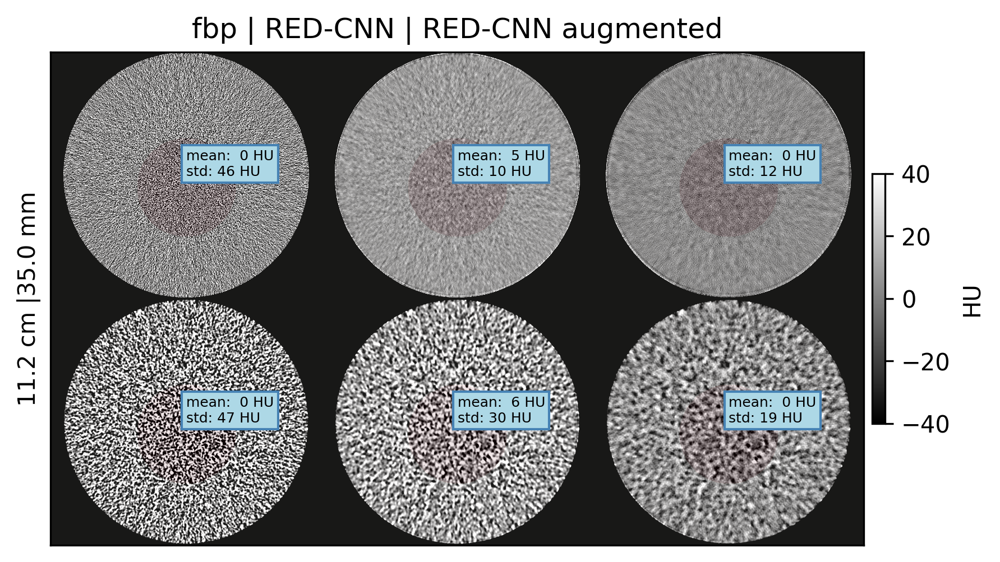

In [6]:
plt.figure(dpi=300)
# @interact use interact for make _montage
make_montage(meta, phantom='uniform', roi_diameter=0.4)

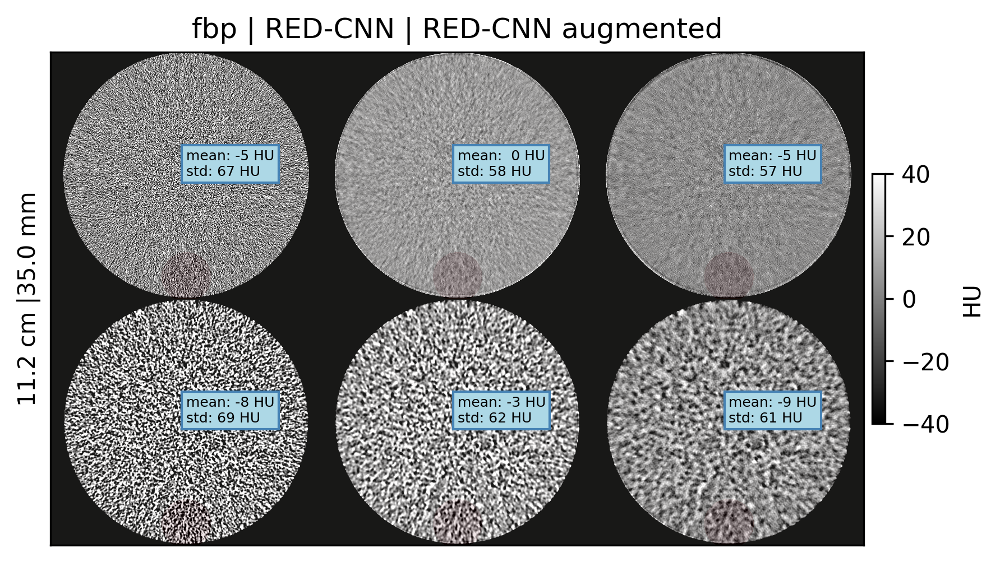

In [7]:
plt.figure(dpi=300)
make_montage(meta, phantom='uniform', roi_diameter=0.2, roi_center=(425, 256))

### noise std [HU] Reduction in Uniform Phantoms

In [8]:
fbp_qd_350 = load_mhd(phantom_dir / meta[(meta.recon == 'fbp') &
                                                 (meta['effective diameter [cm]'] == 35.0) &
                                                 (meta['Dose [%]'] == 25) &
                                                 (meta['phantom']=='uniform')].file.item()).squeeze()[0] - 1000

fbp_qd_112 = load_mhd(phantom_dir / meta[(meta.recon == 'fbp') &
                                                 (meta['effective diameter [cm]'] == 11.2) &
                                                 (meta['Dose [%]'] == 25) &
                                                 (meta['phantom']=='uniform')].file.item()).squeeze()[0] - 1000

red_qd_350 = load_mhd(phantom_dir / meta[(meta.recon == 'RED-CNN') &
                                                 (meta['effective diameter [cm]'] == 35.0) &
                                                 (meta['Dose [%]'] == 25) &
                                                 (meta['phantom']=='uniform')].file.item()).squeeze()[0] - 0

red_qd_112 = load_mhd(phantom_dir / meta[(meta.recon == 'RED-CNN') &
                                                 (meta['effective diameter [cm]'] == 11.2) &
                                                 (meta['Dose [%]'] == 25) &
                                                 (meta['phantom']=='uniform')].file.item()).squeeze()[0] - 0

redaug_qd_350 = load_mhd(phantom_dir / meta[(meta.recon == 'RED-CNN augmented') &
                                                    (meta['effective diameter [cm]'] == 35.0) &
                                                    (meta['Dose [%]'] == 25) &
                                                    (meta['phantom']=='uniform')].file.item()).squeeze()[0] - 0

redaug_qd_112 = load_mhd(phantom_dir / meta[(meta.recon == 'RED-CNN augmented') &
                                                    (meta['effective diameter [cm]'] == 11.2) &
                                                    (meta['Dose [%]'] == 25) &
                                                    (meta['phantom']=='uniform')].file.item()).squeeze()[0] - 0

phantom_diameter_px = get_circle_diameter(fbp_qd_350)
circle_selection_diameter_px = 0.4*phantom_diameter_px # iec standard suggests centred circle ROI 40% of phantom diameter 
circle_selection = circle_select(fbp_qd_350, xy=(256, 256), r = circle_selection_diameter_px/2)

In [9]:
# from itkwidgets import view
# view(fbp_qd_350)

In [10]:
from utils import noise_reduction

print(f'Large diameter denoising efficiency [RED-CNN]: %{noise_reduction(fbp_qd_350[circle_selection].std(), red_qd_350[circle_selection].std()):2.2f}')
print(f'Small diameter denoising efficiency [RED-CNN]: %{noise_reduction(fbp_qd_112[circle_selection].std(), red_qd_112[circle_selection].std()):2.2f}')
print('---------------------------------------------------------------')
print(f'Large diameter denoising efficiency [RED-CNN Augmented]: %{noise_reduction(fbp_qd_350[circle_selection].std(), redaug_qd_350[circle_selection].std()):2.2f}')
print(f'Small diameter denoising efficiency [RED-CNN Augmented]: %{noise_reduction(fbp_qd_112[circle_selection].std(), redaug_qd_112[circle_selection].std()):2.2f}')

Large diameter denoising efficiency [RED-CNN]: %78.29
Small diameter denoising efficiency [RED-CNN]: %36.74
---------------------------------------------------------------
Large diameter denoising efficiency [RED-CNN Augmented]: %73.19
Small diameter denoising efficiency [RED-CNN Augmented]: %60.09


Looks like augmentation lead to better denoising efficiency in the smaller phantom! ^^ [denoised std/fbp std] --> **[30 HU/48 HU] for REDCNN, compared to [19 HU/48 HU] for augmented!**


**a class would be useful for storing image info and results too..**, mostly for holding the ground truth image and having methods to do different measurements and add them

In [11]:
from utils import measure_roi_std_results, calculate_noise_reduction
results_csv = Path('results.csv')

overwrite_results = False

if results_csv.exists() and not overwrite_results:
    results = pd.read_csv(results_csv)
else:
    results = measure_rmse_results(meta)
    results['noise std [HU]'] = measure_roi_std_results(meta)['noise std [HU]']
    results = calculate_noise_reduction(results, 'rmse')
    results = calculate_noise_reduction(results, 'noise std [HU]')
results

/tmp/ipykernel_2218360/1404341505.py:7: DtypeWarning: Columns (1,4,9,20) have mixed types. Specify dtype option on import or set low_memory=False.
  results = pd.read_csv(results_csv)


,experiment,Code #,Name,age [year],gender,weight [kg],height [cm],BMI,weight percentile,ethnicity,...,RMSE [HU],noise std [HU],rmse reduction [%],noise std reduction [%],observer,contrast [HU],snr,auc,delta auc,pediatric subgroup
0,noise reduction,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,...,37.202656,27.290950,36.982130,65.015401,NaN,NaN,NaN,NaN,NaN,newborn
1,noise reduction,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,...,37.324512,27.919199,36.775716,64.210042,NaN,NaN,NaN,NaN,NaN,newborn
2,noise reduction,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,...,37.225440,24.748623,36.943534,68.274442,NaN,NaN,NaN,NaN,NaN,newborn
3,noise reduction,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,...,37.082504,27.282190,37.185656,65.026631,NaN,NaN,NaN,NaN,NaN,newborn
4,noise reduction,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,...,36.786850,25.111681,37.686467,67.809033,NaN,NaN,NaN,NaN,NaN,newborn
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129075,task performance,NaN,35.0 cm MITA-LCD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NPW 2D,3.0,1.455877,0.8480,0.0234,adult
129076,task performance,NaN,35.0 cm MITA-LCD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NPW 2D,3.0,1.252556,0.8214,-0.0032,adult
129077,task performance,NaN,35.0 cm MITA-LCD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NPW 2D,3.0,1.214887,0.8060,-0.0186,adult
129078,task performance,NaN,35.0 cm MITA-LCD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NPW 2D,3.0,1.260605,0.8189,-0.0057,adult


<Axes: xlabel='effective diameter [cm]', ylabel='noise std [HU]'>

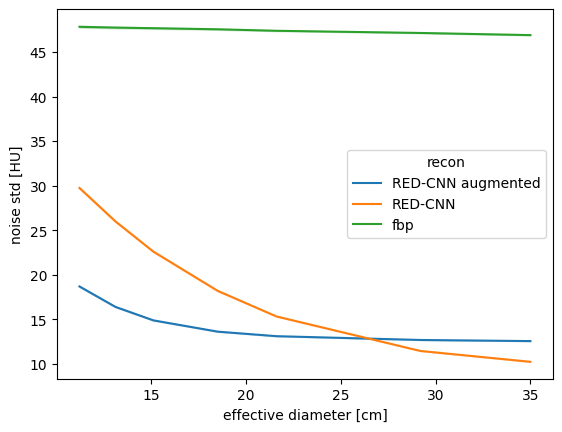

In [12]:
sns.lineplot(data=results[(results['Dose [%]']==25) &
                          (results['effective diameter [cm]'] != 20) &
                          (results.phantom=='uniform')], x='effective diameter [cm]', y='noise std [HU]', hue='recon')

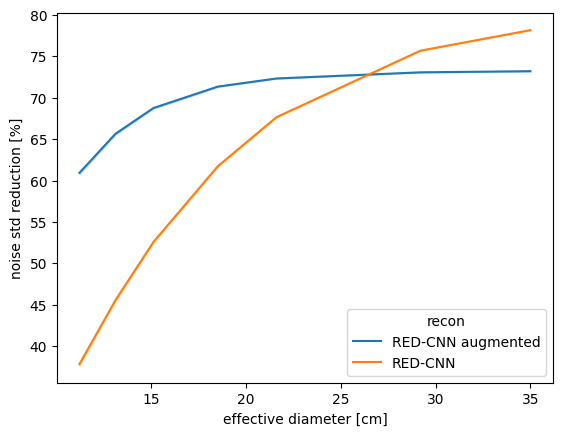

In [13]:
sns.lineplot(data=results[(results['Dose [%]']==25) &
                          (results['effective diameter [cm]'] != 20) &
                          (results.phantom=='uniform') &
                          (results.recon != 'fbp')], x='effective diameter [cm]', y='noise std reduction [%]', hue='recon')
plt.savefig('noise_std_reduction.png', dpi=600)

<Axes: xlabel='effective diameter [cm]', ylabel='noise std reduction [%]'>

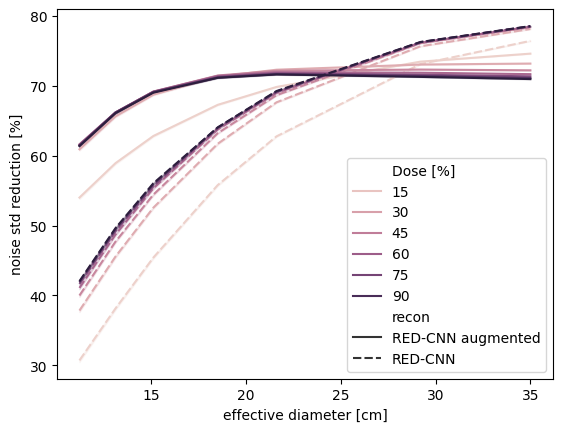

In [14]:
sns.lineplot(data=results[(results['effective diameter [cm]'] != 20) &
                          (results.phantom=='uniform') &
                          (results.recon != 'fbp')], x='effective diameter [cm]', y='noise std reduction [%]', hue='Dose [%]', style='recon')

Looks like the models behave pretty uniformly for dose levels in between quarter dose (25%) and full dose (100%) but for really low doses below the low dose training inputs, such as 15% dose, both RED-CNN and augmented RED-CNN underperform indicated that going for a dose even lower than what was seen during training is also considered out of distribution whereas doses in between training min and max act as in distribution.

### RMSE Reduction in Uniform Phantoms

The original RED-CNN model was most performant on the larger diameter phantom, but noise reduction dropped in the smaller diameter phantom. However, when augmentation is used in training the noise reduction improves in small phantoms! We can expand these measurements to all uniform phantom sizes to get the follow plot and see that our measures above lie on the far extremes of the plot but the trend persists across sizes

<Axes: xlabel='effective diameter [cm]', ylabel='RMSE [HU]'>

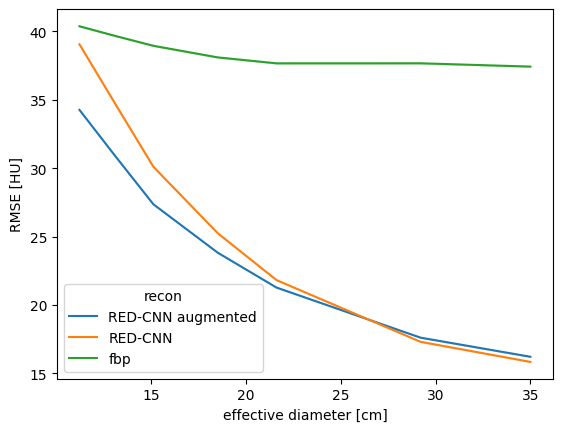

In [15]:
sns.lineplot(data=results[(results['Dose [%]']==25) &
                          (results['effective diameter [cm]'] != 20) &
                          (results.phantom=='uniform')], x='effective diameter [cm]', y='RMSE [HU]', hue='recon')

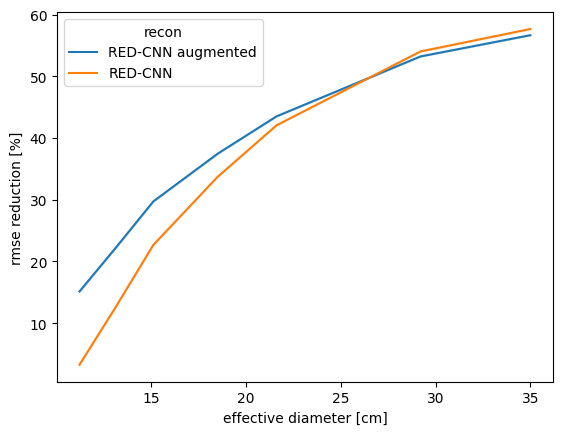

In [16]:
sns.lineplot(data=results[(results['Dose [%]']==25) &
                          (results['effective diameter [cm]'] != 20) &
                          (results.phantom=='uniform') &
                          (results.recon != 'fbp')], x='effective diameter [cm]', y='rmse reduction [%]', hue='recon')
plt.savefig('noise_rmse_reduction.png', dpi=600)

Compared to noise reduction, there isn't as much of a performance gap in adults when measuring RMSE

<Axes: xlabel='effective diameter [cm]', ylabel='RMSE [HU]'>

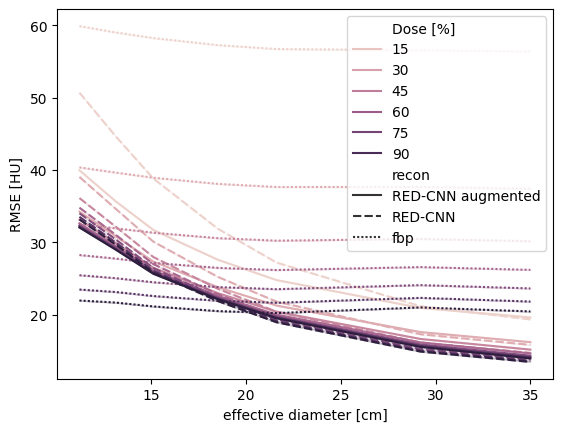

In [17]:
sns.lineplot(data=results[(results['effective diameter [cm]'] != 20) &
                          (results.phantom=='uniform')], x='effective diameter [cm]', y='RMSE [HU]', hue='Dose [%]', style='recon')

<Axes: xlabel='effective diameter [cm]', ylabel='rmse reduction [%]'>

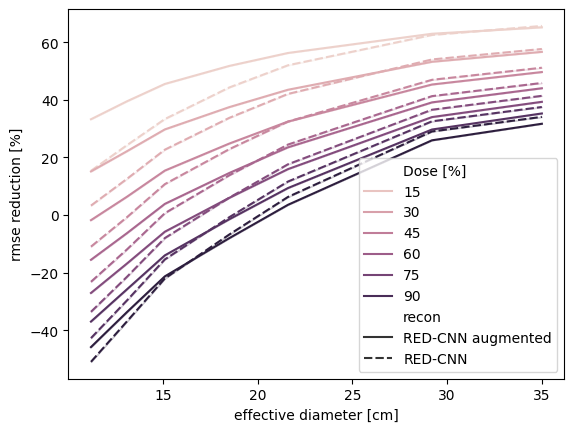

In [18]:
sns.lineplot(data=results[(results['effective diameter [cm]'] != 20) &
                          (results.phantom=='uniform') &
                          (results.recon != 'fbp')], x='effective diameter [cm]', y='rmse reduction [%]', hue='Dose [%]', style='recon')

### Side investigation: comparison of adding noise to training vs adding back part of the fbp image?
**TODO** Need to confirm that training side data augmentation is not inferior to just adding back some noise as done above^

In [19]:
results.head()

,experiment,Code #,Name,age [year],gender,weight [kg],height [cm],BMI,weight percentile,ethnicity,...,RMSE [HU],noise std [HU],rmse reduction [%],noise std reduction [%],observer,contrast [HU],snr,auc,delta auc,pediatric subgroup
0,noise reduction,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,...,37.202656,27.290950,36.982130,65.015401,NaN,NaN,NaN,NaN,NaN,newborn
1,noise reduction,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,...,37.324512,27.919199,36.775716,64.210042,NaN,NaN,NaN,NaN,NaN,newborn
2,noise reduction,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,...,37.225440,24.748623,36.943534,68.274442,NaN,NaN,NaN,NaN,NaN,newborn
3,noise reduction,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,...,37.082504,27.282190,37.185656,65.026631,NaN,NaN,NaN,NaN,NaN,newborn
4,noise reduction,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,...,36.786850,25.111681,37.686467,67.809033,NaN,NaN,NaN,NaN,NaN,newborn


In [20]:
redaug_img = load_mhd(results[(results.recon=='RED-CNN augmented') &
                              (results['Dose [%]']==25) &
                              (results['effective diameter [cm]']==35) &
                              (results['phantom'] == 'uniform')].iloc[0].file)

red_img = load_mhd(results[(results.recon=='RED-CNN') &
                           (results['Dose [%]']==25) &
                           (results['effective diameter [cm]']==35) &
                           (results['phantom'] == 'uniform')].iloc[0].file)

fbp_img = load_mhd(results[(results.recon=='fbp') &
                           (results['Dose [%]']==25) &
                           (results['effective diameter [cm]']==35) &
                           (results['phantom'] == 'uniform')].iloc[0].file).astype('float32') - 1000

add_back = red_img + 0.35*(fbp_img - red_img)

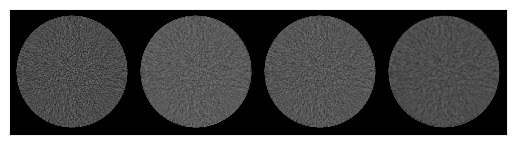

In [21]:
wwwl = (100, 20)
ctshow(np.concatenate([fbp_img[0], red_img[0], add_back[0], redaug_img[0]], axis=1), wwwl)

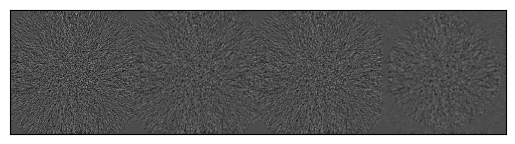

In [22]:
wwwl = (100, 20)
ctshow(np.concatenate([fbp_img[0]-fbp_img[1], red_img[0]-red_img[1], add_back[0]-add_back[1], redaug_img[0]-redaug_img[1]], axis=1), wwwl)

In [23]:
[o.std() for o in [fbp_img[0]-fbp_img[1], red_img[0]-red_img[1], add_back[0]-add_back[1], redaug_img[0]-redaug_img[1]]]

[51.399006, 12.3216505, 24.977684, 14.768357]

## Noise Reduction in Anthropomorphic Phantoms

Because ground truth is known we can evaluate noise removal as root mean squared error (RMSE) reduction.

We calculate RMSE by comparing the reconstructed image on the left to the ground truth on the right

### noise std [HU] Reduction in Anthropomorphic Phantoms

Calculating noise reduction using standard deviation ROI measurements is slightly more complicated due to the more heterogenous anthropmorphic phantoms. To ensure we are sampling a uniform region and not a boundary region which will give a high std value but not be indicative of noise, we will use this `add_random_circle_lesion` function which takes as an optional argument a `mask` to specify a domain to place the random roi within. 

In [24]:
from utils import add_random_circle_lesion

In [25]:
add_random_circle_lesion?

Signature: add_random_circle_lesion(image, mask, radius=20, contrast=-100)
Docstring:
Returns tuple of (image with lesion, lesion only image, lesion coordinate (x,y))
:tol: tolerance of fitting lesion into mask, smaller values increases the requirement ensuring more of the circle overlaps with the mask
File:      ~/Dev/PediatricCTSizeAugmentation/notebooks/utils.py
Type:      function

Below we can experiment with some reasonable HU cutoffs to get the liver, note we are doing these thresholds on the ground truth `gt` image so noise is not a factor when getting the mask.

In [26]:
patient = meta[meta['phantom'] == 'anthropomorphic'].iloc[0]
patient

Code #                                                     Reference newborn
Name                                                             male infant
age [year]                                                             0.166
gender                                                                     M
weight [kg]                                                              3.8
height [cm]                                                             52.0
BMI                                                                     14.1
weight percentile                                                       36.0
ethnicity                                                                NaN
effective diameter [cm]                                                 11.1
Dose [%]                                                                  10
recon                                                      RED-CNN augmented
phantom                                                      anthropomorphic

In [27]:
from utils import center_crop

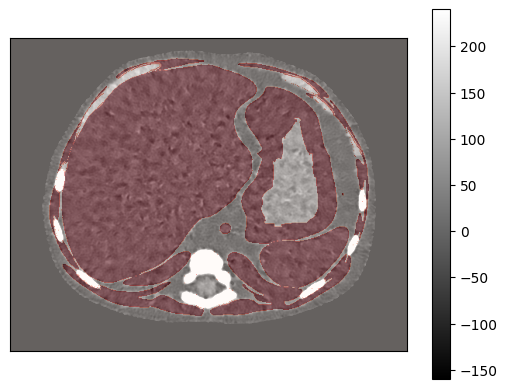

In [28]:
img = center_crop(load_mhd(patient.file)[0])
gt = center_crop(load_mhd(get_ground_truth(patient.file)) - 1000)
ctshow(img)
plt.colorbar()
mask = (gt >= 50) & (gt < 100)
plt.imshow(mask, alpha=0.4, cmap='Reds') 

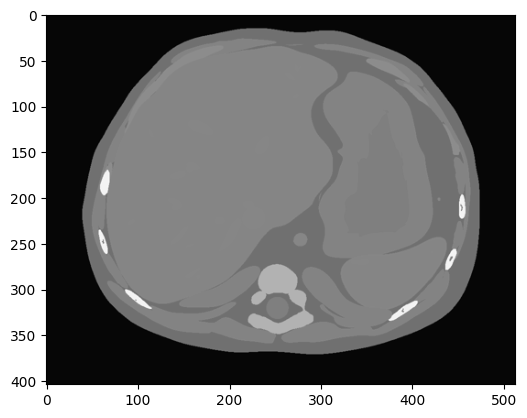

In [29]:
plt.imshow(gt, cmap='gray')

By rerunning the cell below multiple times we see the ROI stays in the liver but in different locations each time

Text(0.5, 1.0, 'mean: 63 HU\nstd: 27 HU')

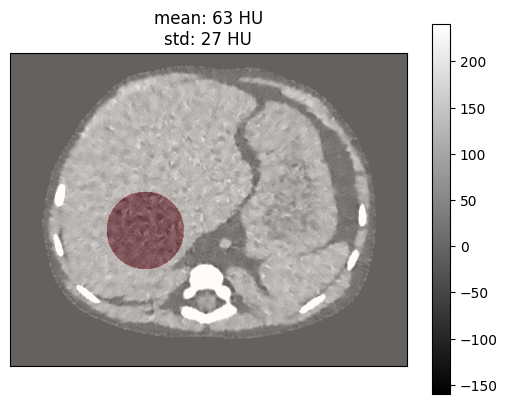

In [30]:
circle_selection = add_random_circle_lesion(img, mask, radius=50)[1].astype(bool)
ctshow(img)
plt.colorbar()
mask = (gt >= 50) & (gt < 100)
plt.imshow(circle_selection, alpha=0.4, cmap='Reds')
plt.title(f'mean: {img[circle_selection].mean():2.0f} HU\nstd: {img[circle_selection].std():2.0f} HU')

This `add_random_circle_lesion` is built into the `make_montage` visualization function to qualitatively compare noise magnitude reduction across reconstruction types, patient size and other parameters

In [31]:
make_montage??

Signature:
make_montage(
    meta_df: pandas.core.frame.DataFrame,
    dose: int = 25,
    diameters: list = [35.0, 11.2],
    recons: list = ['fbp', 'RED-CNN', 'RED-CNN augmented'],
    phantom: str = 'MITA-LCD',
    roi_diameter: float | int = 0.4,
    roi_center: tuple | str = (256, 256),
    wwwl=(80, 0),
    crop_to_fit=True,
)
Source:   
def make_montage(meta_df:pd.DataFrame, dose:int=25, diameters:list=[35.0, 11.2], recons:list = ['fbp', 'RED-CNN', 'RED-CNN augmented'],
                 phantom:str = 'MITA-LCD', roi_diameter:float|int=0.4, roi_center:tuple|str=(256, 256),  wwwl = (80, 0), crop_to_fit=True):
    """
    make image montage based on given argument parameters. Recons are plotted horizontally along the x axis while different diameters are plotted on y
    :Parameters:
        :meta_df: metadata dataframe
        :dose: dose level in percent [%]
        :diameters: phantom effective diameter in cm
        :recons: list of recon kernels to display on the horizontal x-a

The doc strings describe that rois can be manually placed using a `tuple` as shown below with `roi_center = (x, y)`

Or alternatively an organ can be specified if using an anthropomorphic phantom and an ROI will be randomly place in that ROI, this is useful for the anthropomorphic phantoms because due to size and placement differences between scans the same roi xy coordinates might not always be in the liver

In [32]:
def browse_montage(diameter, recon, **kwargs):
    make_montage(meta_df = meta, roi_center = 'liver', wwwl=(300, 40), diameters=[diameter], recons=[recon], **kwargs)

In [33]:
interact(browse_montage, phantom=meta.phantom.unique(), dose=sorted(meta['Dose [%]'].unique(), reverse=True), diameter = sorted(meta['effective diameter [cm]'].unique()), recon=meta['recon'].unique(), roi_diameter=[0.1, 0.2, 0.3, 0.4, 0.5])

interactive(children=(Dropdown(description='diameter', options=(11.1, 11.2, 13.1, 15.1, 15.4, 16.0, 16.2, 16.3…

<function __main__.browse_montage(diameter, recon, **kwargs)>

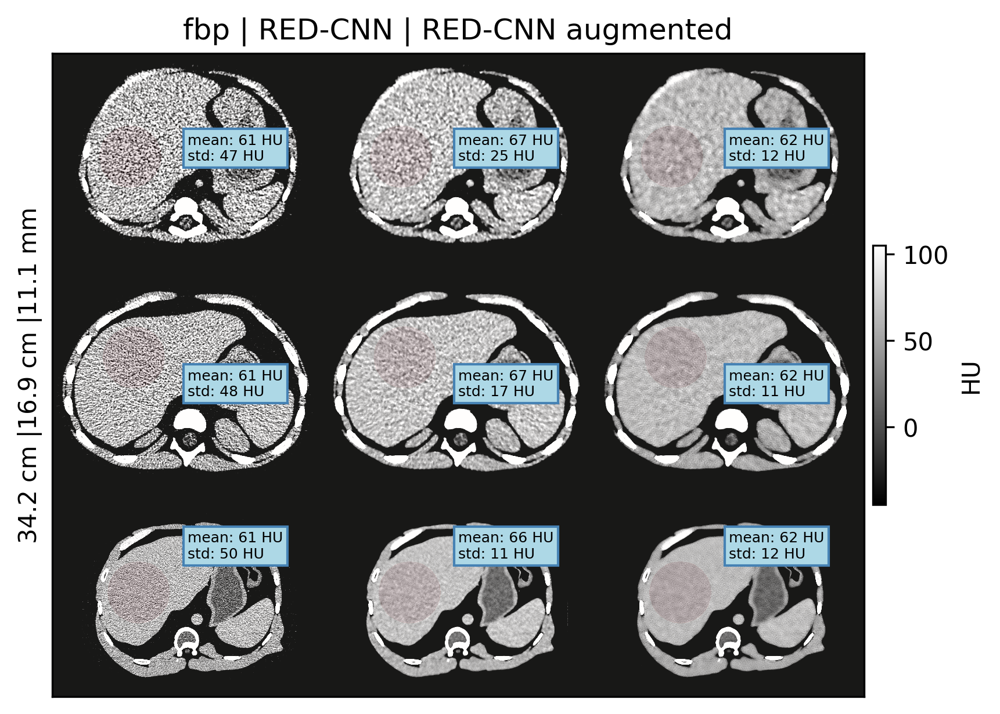

In [34]:
plt.figure(dpi=300)
make_montage(meta, dose=25, phantom='anthropomorphic', diameters=[11.1, 16.9, 34.2], wwwl=(150, 30), roi_center='liver', roi_diameter=0.25)
plt.savefig('anthro_montage.png', dpi=600)

This anthropomorphic images are supposed to be around the liver, which is uniform so there should be enough space on each image to sample a large circle roi for noise measures

## Putting it all together: plotting trends

In [35]:
results['is adult'] = results['age [year]'] >= 22

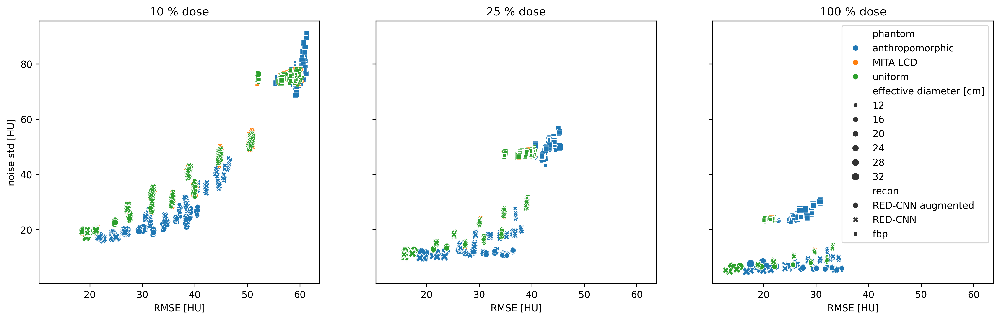

In [36]:
f, axs = plt.subplots(1, 3, dpi=300, sharex=True, sharey=True, figsize=(18,5))
for ax, dose in zip(axs, [10, 25, 100]):
    legend = False if dose < 100 else True
    sns.scatterplot(ax=ax, data=results[results['Dose [%]']==dose], x='RMSE [HU]', y='noise std [HU]', hue='phantom', style='recon', size='effective diameter [cm]', legend=legend)
    ax.set_title(f'{dose} % dose')

Do RMSE and noise correlate? For the most part yes, (not sure if this plot is super valuable but it addresses the previous point)

<Axes: xlabel='age [year]', ylabel='weight [kg]'>

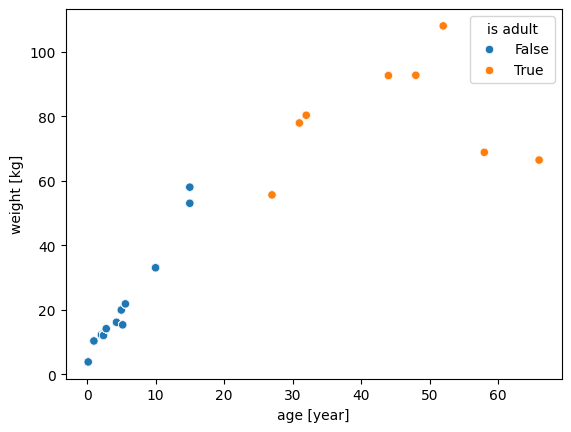

In [37]:
import seaborn as sns
sns.scatterplot(data=results, x='age [year]', y='weight [kg]', hue='is adult')

<Axes: xlabel='age [year]', ylabel='effective diameter [cm]'>

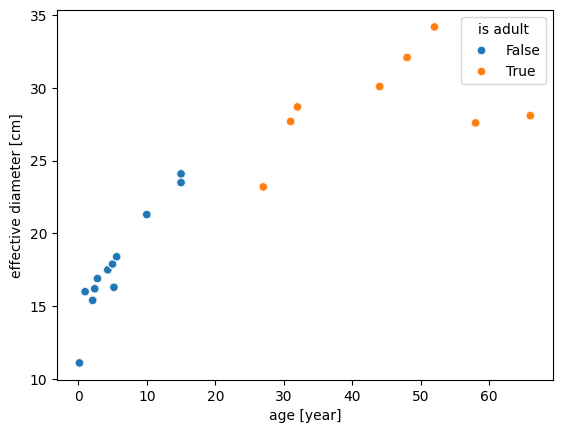

In [38]:
sns.scatterplot(data=results, x='age [year]', y='effective diameter [cm]', hue='is adult')

In [39]:
len(results[results['is adult']==True].Name.unique()), len(results[results['is adult']==False].Name.unique())

(8, 28)

In [40]:
sys.path.append('../..')
from noise_assessments import order_recons
recon_order = order_recons(results.recon.unique())

<Axes: xlabel='effective diameter [cm]', ylabel='RMSE [HU]'>

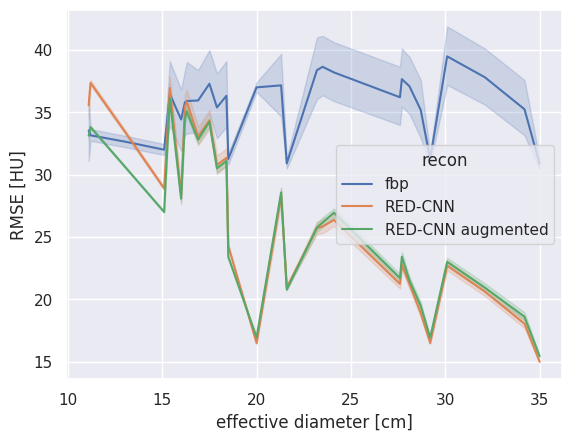

In [41]:
sns.lineplot(data=results, x='effective diameter [cm]', y='RMSE [HU]', hue='recon', hue_order=recon_order)

In [42]:
results.sort_values(by=['effective diameter [cm]', 'Dose [%]'])

,experiment,Code #,Name,age [year],gender,weight [kg],height [cm],BMI,weight percentile,ethnicity,...,noise std [HU],rmse reduction [%],noise std reduction [%],observer,contrast [HU],snr,auc,delta auc,pediatric subgroup,is adult
0,noise reduction,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,...,27.290950,36.982130,65.015401,NaN,NaN,NaN,NaN,NaN,newborn,False
1,noise reduction,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,...,27.919199,36.775716,64.210042,NaN,NaN,NaN,NaN,NaN,newborn,False
2,noise reduction,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,...,24.748623,36.943534,68.274442,NaN,NaN,NaN,NaN,NaN,newborn,False
3,noise reduction,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,...,27.282190,37.185656,65.026631,NaN,NaN,NaN,NaN,NaN,newborn,False
4,noise reduction,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,...,25.111681,37.686467,67.809033,NaN,NaN,NaN,NaN,NaN,newborn,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129075,task performance,NaN,35.0 cm MITA-LCD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NPW 2D,3.0,1.455877,0.8480,0.0234,adult,False
129076,task performance,NaN,35.0 cm MITA-LCD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NPW 2D,3.0,1.252556,0.8214,-0.0032,adult,False
129077,task performance,NaN,35.0 cm MITA-LCD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NPW 2D,3.0,1.214887,0.8060,-0.0186,adult,False
129078,task performance,NaN,35.0 cm MITA-LCD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NPW 2D,3.0,1.260605,0.8189,-0.0057,adult,False


<Axes: xlabel='effective diameter [cm]', ylabel='rmse reduction [%]'>

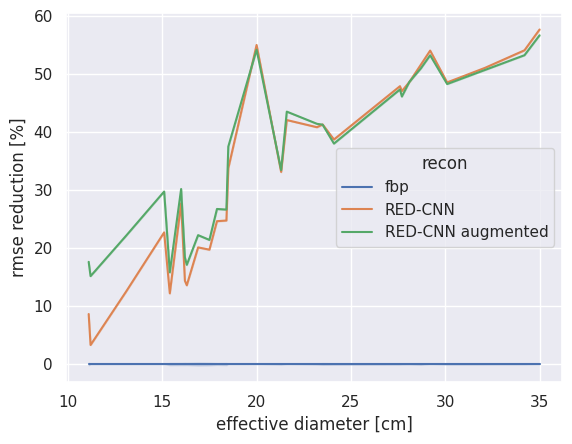

In [43]:
sns.lineplot(data=results[results['Dose [%]']==25], x='effective diameter [cm]', y='rmse reduction [%]', hue='recon', hue_order=recon_order)

<Axes: xlabel='effective diameter [cm]', ylabel='noise std reduction [%]'>

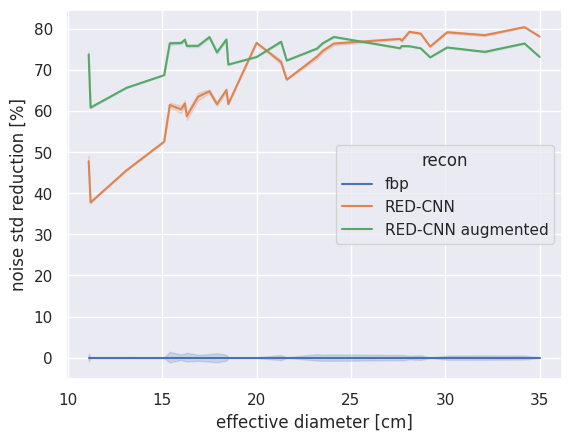

In [44]:
sns.lineplot(data=results[results['Dose [%]']==25], x='effective diameter [cm]', y='noise std reduction [%]', hue='recon', hue_order=recon_order)

In [45]:
infant = results[(results.Name == 'male infant')]
infant.head()

,experiment,Code #,Name,age [year],gender,weight [kg],height [cm],BMI,weight percentile,ethnicity,...,noise std [HU],rmse reduction [%],noise std reduction [%],observer,contrast [HU],snr,auc,delta auc,pediatric subgroup,is adult
0,noise reduction,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,...,27.290950,36.982130,65.015401,NaN,NaN,NaN,NaN,NaN,newborn,False
1,noise reduction,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,...,27.919199,36.775716,64.210042,NaN,NaN,NaN,NaN,NaN,newborn,False
2,noise reduction,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,...,24.748623,36.943534,68.274442,NaN,NaN,NaN,NaN,NaN,newborn,False
3,noise reduction,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,...,27.282190,37.185656,65.026631,NaN,NaN,NaN,NaN,NaN,newborn,False
4,noise reduction,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,...,25.111681,37.686467,67.809033,NaN,NaN,NaN,NaN,NaN,newborn,False


In [46]:
infant_study = results[(results.Name == 'male infant') & (results['Dose [%]'] == 25) & (results.recon=='fbp')].iloc[0]
print(infant_study)
infant_img = load_mhd(anthro_dir / infant_study.file)[0] - 1000
infant_base_denoised =  load_mhd(anthro_dir / results[(results.Name == 'male infant') & (results['Dose [%]'] == 25) & (results.recon=='RED-CNN')].iloc[0].file)[0]
infant_aug_denoised =  load_mhd(anthro_dir / results[(results.Name == 'male infant') & (results['Dose [%]'] == 25) & (results.recon=='RED-CNN augmented')].iloc[0].file)[0]
infant_gt = load_mhd(anthro_dir / get_ground_truth(infant_study.file)) - 1000

experiment                                                   noise reduction
Code #                                                     Reference newborn
Name                                                             male infant
age [year]                                                             0.166
gender                                                                     M
weight [kg]                                                              3.8
height [cm]                                                             52.0
BMI                                                                     14.1
weight percentile                                                       36.0
ethnicity                                                                NaN
effective diameter [cm]                                                 11.1
Dose [%]                                                                  25
recon                                                                    fbp

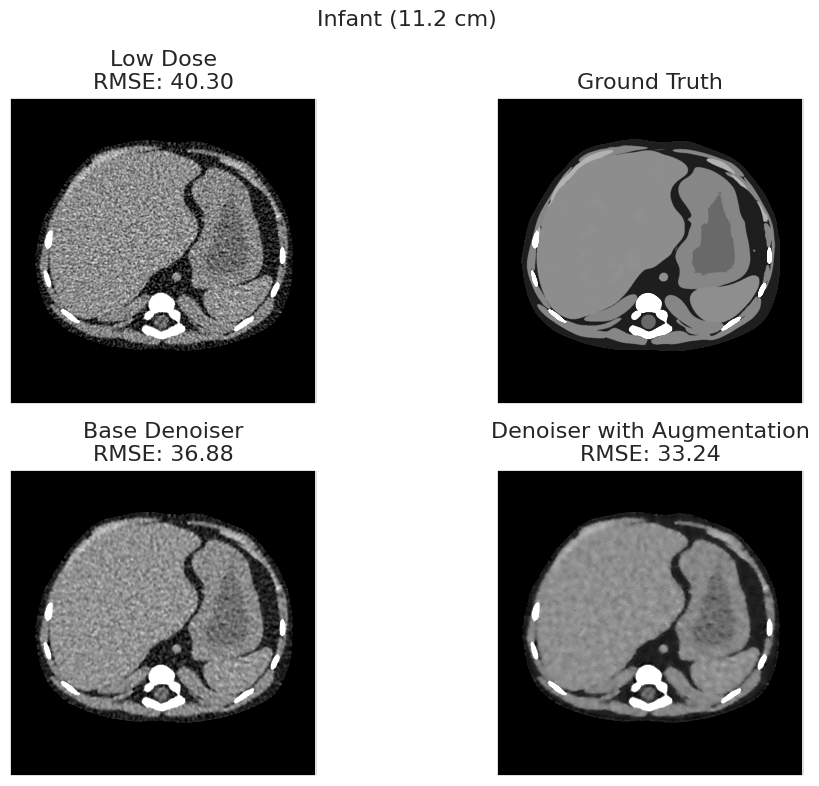

In [47]:
from utils import rmse
plt.figure(figsize=(16, 8), tight_layout=True)
plt.suptitle('Infant (11.2 cm)', fontsize=16)

plt.subplot(2, 2, 1)
plt.title(f'Low Dose\nRMSE: {rmse(infant_img, infant_gt):2.2f}', fontsize=16)
ctshow(infant_img.squeeze())

plt.subplot(2, 2, 2)
plt.title('Ground Truth', fontsize=16)
ctshow(infant_gt.squeeze())

plt.subplot(2, 2, 3)
plt.title(f'Base Denoiser\nRMSE: {rmse(infant_base_denoised, infant_gt):2.2f}', fontsize=16)
ctshow(infant_base_denoised.squeeze())

plt.subplot(2, 2, 4)
plt.title(f'Denoiser with Augmentation\nRMSE: {rmse(infant_aug_denoised, infant_gt):2.2f}', fontsize=16)
ctshow(infant_aug_denoised.squeeze())

In [48]:
name = 'male pt148'
adult_study = results[(results.Name == name) & (results['Dose [%]'] == 25) & (results.recon=='fbp')].iloc[0]
print(adult_study)
adult_img = load_mhd(anthro_dir / adult_study.file)[0] - 1000
adult_base_denoised =  load_mhd(anthro_dir / results[(results.Name == 'male pt148') & (results['Dose [%]'] == 25) & (results.recon=='RED-CNN')].iloc[0].file)[0]
adult_aug_denoised =  load_mhd(anthro_dir / results[(results.Name == 'male pt148') & (results['Dose [%]'] == 25) & (results.recon=='RED-CNN augmented')].iloc[0].file)[0]
adult_gt = load_mhd(anthro_dir / get_ground_truth(adult_study.file)) - 1000

experiment                                                   noise reduction
Code #                                                                   148
Name                                                              male pt148
age [year]                                                              52.0
gender                                                                     M
weight [kg]                                                            108.0
height [cm]                                                            183.2
BMI                                                                    32.18
weight percentile                                                       92.5
ethnicity                                                              white
effective diameter [cm]                                                 34.2
Dose [%]                                                                  25
recon                                                                    fbp

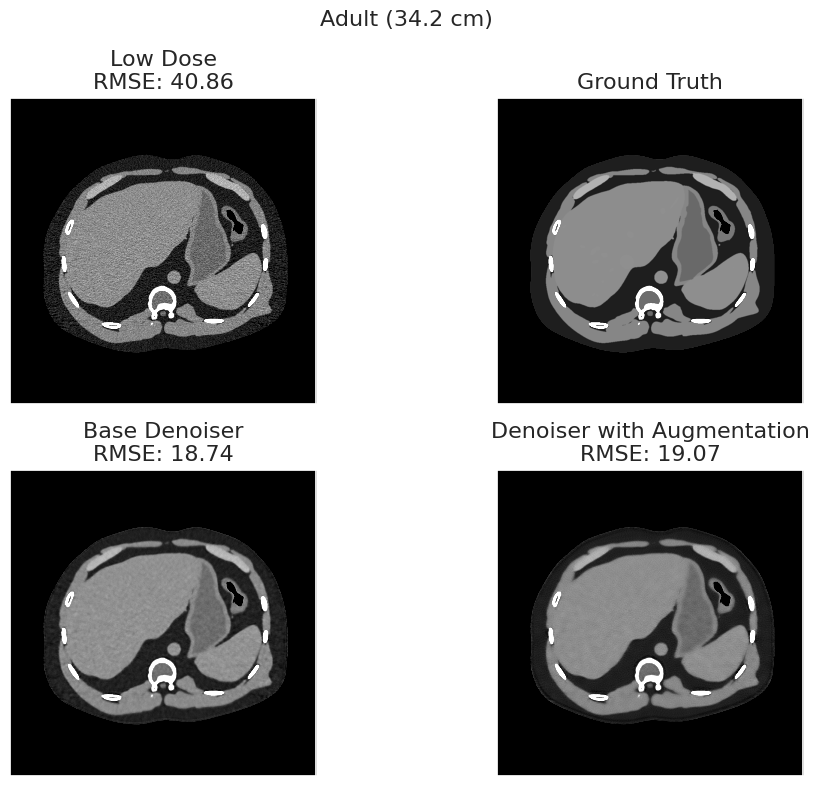

In [49]:
plt.figure(figsize=(16, 8), tight_layout=True)
plt.suptitle('Adult (34.2 cm)', fontsize=16)

plt.subplot(2, 2, 1)
plt.title(f'Low Dose\nRMSE: {rmse(adult_img, adult_gt):2.2f}', fontsize=16)
ctshow(adult_img.squeeze())

plt.subplot(2, 2, 2)
plt.title('Ground Truth', fontsize=16)
ctshow(adult_gt.squeeze())

plt.subplot(2, 2, 3)
plt.title(f'Base Denoiser\nRMSE: {rmse(adult_base_denoised, adult_gt):2.2f}', fontsize=16)
ctshow(adult_base_denoised.squeeze())

plt.subplot(2, 2, 4)
plt.title(f'Denoiser with Augmentation\nRMSE: {rmse(adult_aug_denoised, adult_gt):2.2f}', fontsize=16)
ctshow(adult_aug_denoised.squeeze())

Make these images for a range of sizes infant to adult and [plot RMSE as a function of size](https://github.com/bnel1201/Ped-ETK/blob/main/evaluation/iq_phantom_validation.py) (similar to in [Nelson et al 2022](https://onlinelibrary.wiley.com/doi/abs/10.1002/mp.16901)), I want to see another line with augmentation improve that trend

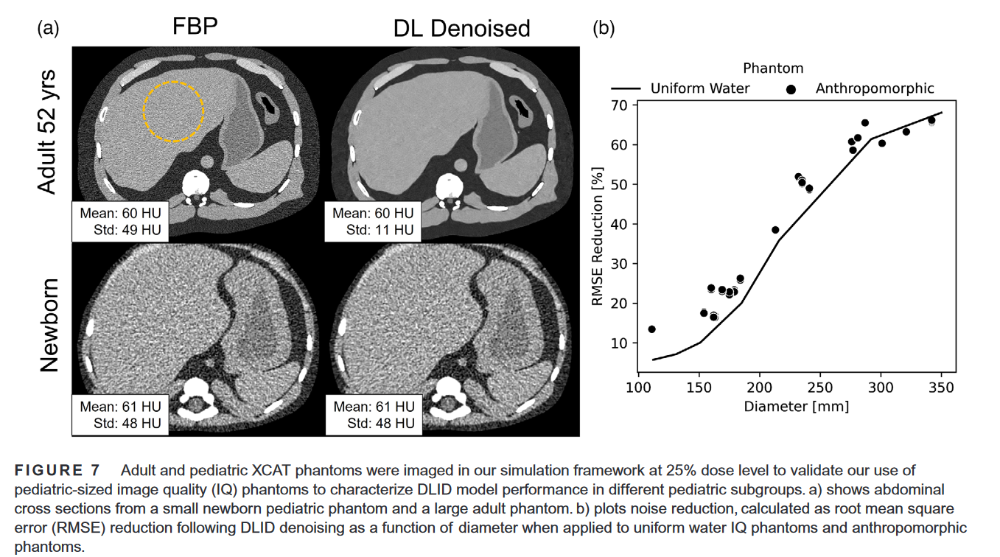

<Axes: xlabel='effective diameter [cm]', ylabel='RMSE [HU]'>

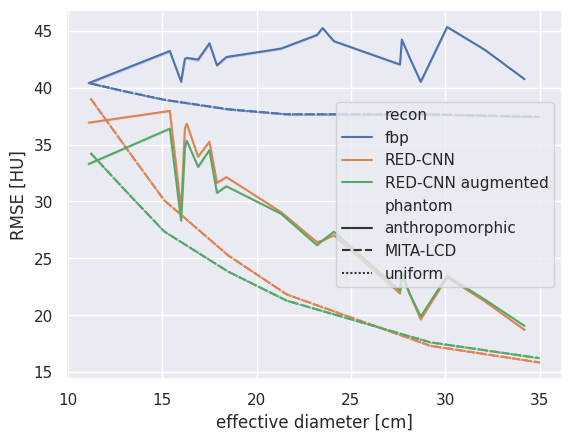

In [50]:
recons = order_recons(results.recon.unique())
sns.lineplot(data=results[(results['Dose [%]']==25) & (results['effective diameter [cm]'] != 20)], x='effective diameter [cm]', y='RMSE [HU]', style='phantom', hue='recon', hue_order=recons) 

<Axes: xlabel='effective diameter [cm]', ylabel='rmse reduction [%]'>

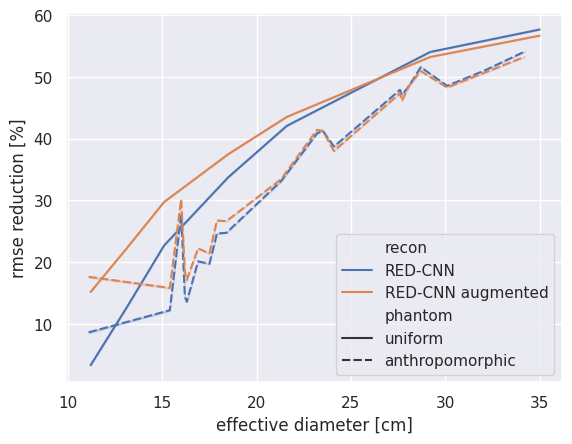

In [51]:
sns.lineplot(data=results[(results['Dose [%]']==25) &
                          (results['effective diameter [cm]'] != 20) &
                          (results['recon'] != 'fbp') &
                          (results['phantom'] != 'MITA-LCD')],
             x='effective diameter [cm]',
             y='rmse reduction [%]',
             style='phantom',
             style_order=['uniform', 'anthropomorphic'],
             hue='recon',
             hue_order=recons[1:]) 

<Axes: xlabel='effective diameter [cm]', ylabel='noise std [HU]'>

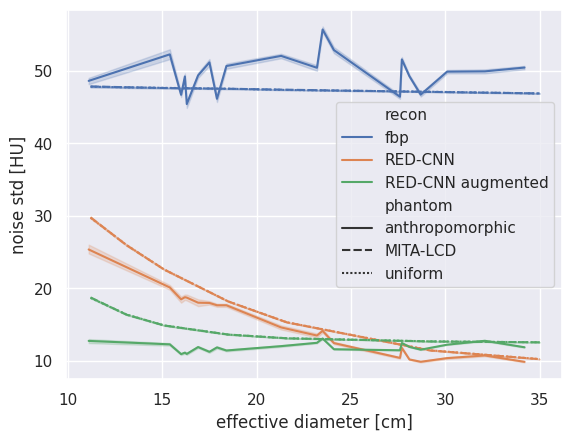

In [52]:
sns.lineplot(data=results[(results['Dose [%]']==25) & (results['effective diameter [cm]'] != 20)], x='effective diameter [cm]', y='noise std [HU]', style='phantom', hue='recon', hue_order=recons) 

<Axes: xlabel='effective diameter [cm]', ylabel='noise std reduction [%]'>

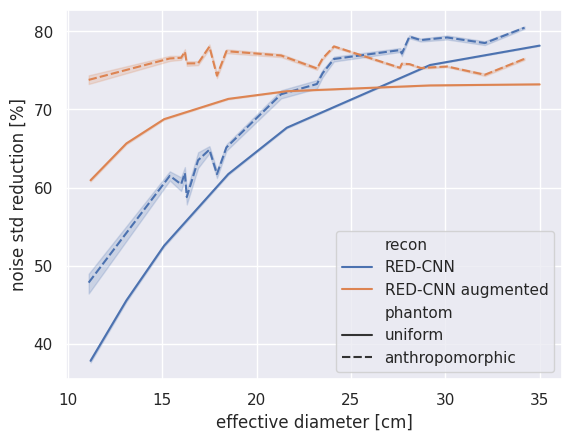

In [53]:
sns.lineplot(data=results[(results['Dose [%]']==25) &
                          (results['effective diameter [cm]'] != 20) &
                          (results['recon'] != 'fbp') &
                          (results['phantom'] != 'MITA-LCD')],
             x='effective diameter [cm]',
             y='noise std reduction [%]',
             style='phantom',
             style_order=['uniform', 'anthropomorphic'],
             hue='recon',
             hue_order=recons[1:]) 

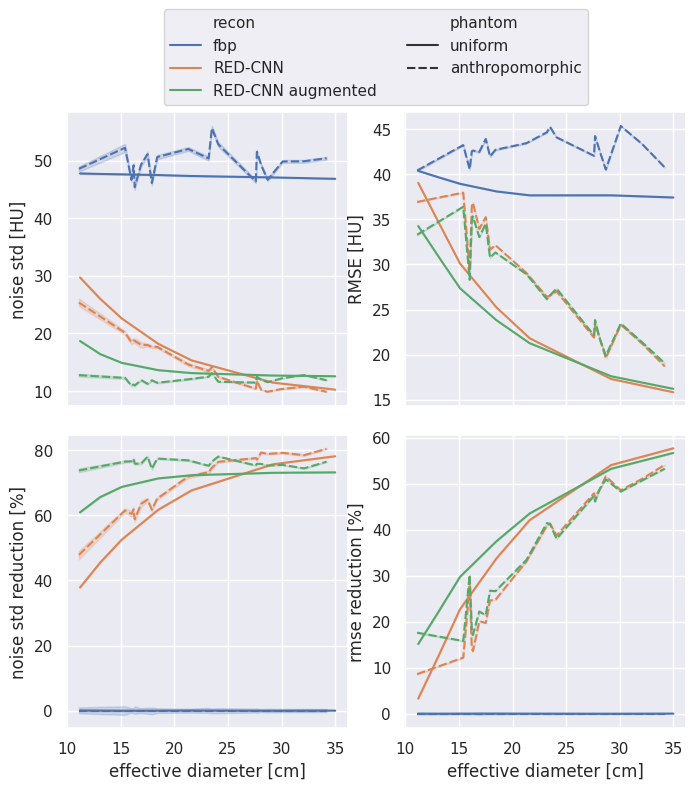

In [54]:
f, axs = plt.subplots(2,2, sharex=True, figsize=(8,8), gridspec_kw=dict(hspace=0.1))
axs=axs.flatten()
for idx, measure in enumerate(['noise std [HU]', 'RMSE [HU]', 'noise std reduction [%]', 'rmse reduction [%]']):
    legend = True if idx == 0 else False
    sns.lineplot(data=results[(results['Dose [%]']==25) &
                     (results['effective diameter [cm]'] != 20) &
                     (results['phantom'] != 'MITA-LCD')],
                 x='effective diameter [cm]',
                 y=measure,
                 style='phantom',
                 style_order=['uniform', 'anthropomorphic'],
                 hue='recon', 
                 hue_order=recons,
                 ax=axs[idx], legend=legend)
sns.move_legend(
    axs[0], "lower center",
    bbox_to_anchor=(1.1, 1), ncol=2,
)
f.savefig('noise_reduction.png', dpi=600, bbox_inches='tight')

<Axes: xlabel='recon', ylabel='noise std reduction [%]'>

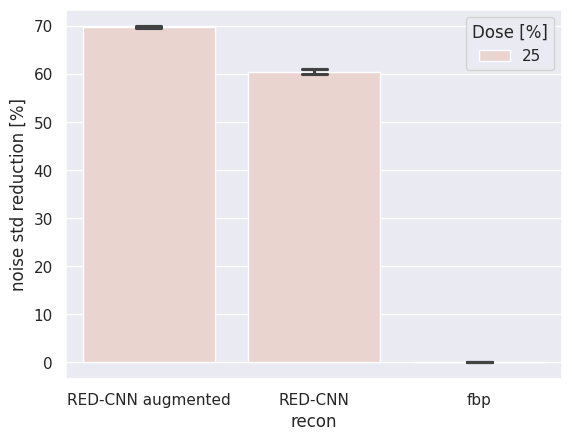

In [55]:
sns.barplot(data=results[(results['effective diameter [cm]']!=20) &
           (results['Dose [%]'] == 25)],
            x='recon',
            y='noise std reduction [%]',
            hue='Dose [%]', capsize=0.15)

<Axes: xlabel='recon', ylabel='noise std reduction [%]'>

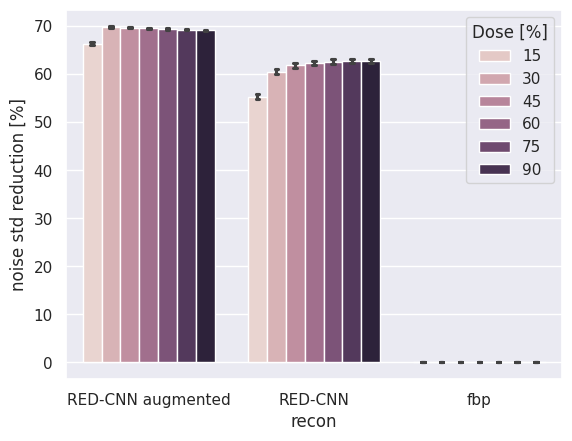

In [56]:
sns.barplot(data=results[results['effective diameter [cm]']!=20],
            x='recon',
            y='noise std reduction [%]',
            hue='Dose [%]',
            capsize=0.15)

<Axes: xlabel='recon', ylabel='rmse reduction [%]'>

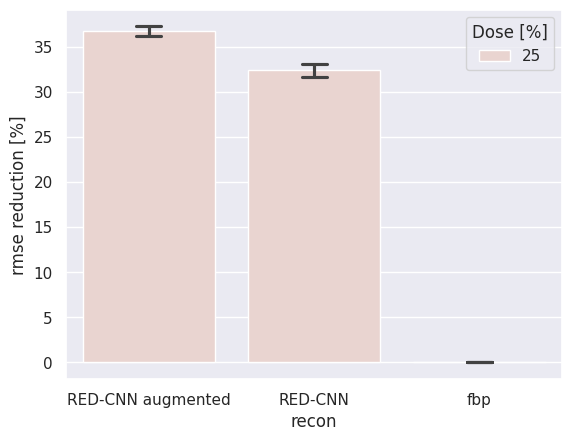

In [57]:
sns.barplot(data=results[(results['effective diameter [cm]']!=20)  & (results['Dose [%]'] == 25)],
            x='recon',
            y='rmse reduction [%]',
            hue='Dose [%]',
            capsize=0.15)

In [58]:
redaug_rmse_reduction_mean = results[(results['effective diameter [cm]']!=20)  &
                                     (results['Dose [%]'] == 25)  &
                                     (results['recon'] == 'RED-CNN augmented')]['rmse reduction [%]'].mean()
red_rmse_reduction_mean = results[(results['effective diameter [cm]']!=20)  &
                                  (results['Dose [%]'] == 25)  &
                                  (results['recon'] == 'RED-CNN')]['rmse reduction [%]'].mean()

redaug_std_reduction_mean = results[(results['effective diameter [cm]']!=20)  &
                                     (results['Dose [%]'] == 25)  &
                                     (results['recon'] == 'RED-CNN augmented')]['noise std reduction [%]'].mean()
red_std_reduction_mean = results[(results['effective diameter [cm]']!=20)  &
                                  (results['Dose [%]'] == 25)  &
                                  (results['recon'] == 'RED-CNN')]['noise std reduction [%]'].mean()
print('Averaged across all diameters')
print(f'RED-CNN noise std [HU] reduction {red_std_reduction_mean:2.2f}\nRED-CNN augmented RMSE reduction {redaug_std_reduction_mean:2.2f}')
print('-----')
print(f'RED-CNN RMSE reduction {red_rmse_reduction_mean:2.2f}\nRED-CNN augmented RMSE reduction {redaug_rmse_reduction_mean:2.2f}')

Averaged across all diameters
RED-CNN noise std [HU] reduction 60.53
RED-CNN augmented RMSE reduction 69.77
-----
RED-CNN RMSE reduction 32.36
RED-CNN augmented RMSE reduction 36.71


In [109]:
for subgroup in ['newborn', 'infant', 'child', 'adolescent', 'adult']:
    print('-------')
    print(subgroup)
    for recon in recons:
        mean_noise_reduction = results[(results['effective diameter [cm]']!=20)  &
                                       (results['Dose [%]'] == 25)  &
                                       (results['recon'] == recon) &
                                       (results['pediatric subgroup'] == subgroup)]['noise std reduction [%]'].mean()
        print(f'{recon} noise std [HU] reduction: {mean_noise_reduction:2.2f} %')

-------
newborn
fbp noise std [HU] reduction: -0.00 %
RED-CNN noise std [HU] reduction: 45.33 %
RED-CNN augmented noise std [HU] reduction: 65.17 %
-------
infant
fbp noise std [HU] reduction: -0.00 %
RED-CNN noise std [HU] reduction: 61.80 %
RED-CNN augmented noise std [HU] reduction: 72.20 %
-------
child
fbp noise std [HU] reduction: -0.00 %
RED-CNN noise std [HU] reduction: 67.90 %
RED-CNN augmented noise std [HU] reduction: 72.50 %
-------
adolescent
fbp noise std [HU] reduction: -0.00 %
RED-CNN noise std [HU] reduction: 76.04 %
RED-CNN augmented noise std [HU] reduction: 73.54 %
-------
adult
fbp noise std [HU] reduction: -0.00 %
RED-CNN noise std [HU] reduction: 78.22 %
RED-CNN augmented noise std [HU] reduction: 73.29 %


In [97]:
results[(results['effective diameter [cm]']!=20)  &
        (results['Dose [%]'] == 25)  &
        (results['recon'] == 'RED-CNN') &
        (results['pediatric subgroup'] == 'adult')]['noise std reduction [%]'].mean()

,experiment,Code #,Name,age [year],gender,weight [kg],height [cm],BMI,weight percentile,ethnicity,...,noise std [HU],rmse reduction [%],noise std reduction [%],observer,contrast [HU],snr,auc,delta auc,pediatric subgroup,is adult
3632,noise reduction,148,male pt148,52.0,M,108.0,183.2,32.18,92.5,white,...,11.702235,53.234324,76.810520,NaN,NaN,NaN,NaN,NaN,adult,True
3639,noise reduction,148,male pt148,52.0,M,108.0,183.2,32.18,92.5,white,...,11.743262,53.187403,76.729220,NaN,NaN,NaN,NaN,NaN,adult,True
3634,noise reduction,148,male pt148,52.0,M,108.0,183.2,32.18,92.5,white,...,11.781191,53.157246,76.654060,NaN,NaN,NaN,NaN,NaN,adult,True
3631,noise reduction,148,male pt148,52.0,M,108.0,183.2,32.18,92.5,white,...,11.864860,53.184216,76.488259,NaN,NaN,NaN,NaN,NaN,adult,True
3633,noise reduction,148,male pt148,52.0,M,108.0,183.2,32.18,92.5,white,...,11.866108,53.375811,76.485786,NaN,NaN,NaN,NaN,NaN,adult,True


In [89]:
results[(results['effective diameter [cm]']!=20)  &
        (results['Dose [%]'] == 25)  &
        (results['recon'] == 'RED-CNN') &
        (results['phantom'] != 'anthropomorphic')].sort_values(by='noise std reduction [%]', ascending=False).head()

,experiment,Code #,Name,age [year],gender,weight [kg],height [cm],BMI,weight percentile,ethnicity,...,noise std [HU],rmse reduction [%],noise std reduction [%],observer,contrast [HU],snr,auc,delta auc,pediatric subgroup,is adult
5684,noise reduction,NaN,35.0 cm MITA-LCD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,9.980228,57.646934,78.717949,NaN,NaN,NaN,NaN,NaN,adult,False
9812,noise reduction,NaN,35.0 cm uniform,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,9.995555,57.760386,78.685267,NaN,NaN,NaN,NaN,NaN,adult,False
5790,noise reduction,NaN,35.0 cm MITA-LCD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,9.999809,57.781520,78.676194,NaN,NaN,NaN,NaN,NaN,adult,False
9862,noise reduction,NaN,35.0 cm uniform,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,10.001450,57.665754,78.672697,NaN,NaN,NaN,NaN,NaN,adult,False
5713,noise reduction,NaN,35.0 cm MITA-LCD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,10.009257,57.761408,78.656047,NaN,NaN,NaN,NaN,NaN,adult,False


In [59]:
redaug_rmse_reduction_mean = results[(results['effective diameter [cm]']!=20) &
                                     (results['Dose [%]'] == 25)  &
                                     (results['recon'] == 'RED-CNN augmented') &
                                     (results['effective diameter [cm]']>30)]['rmse reduction [%]'].mean()
red_rmse_reduction_mean = results[(results['effective diameter [cm]']!=20) &
                                  (results['Dose [%]'] == 25)  &
                                  (results['recon'] == 'RED-CNN') &
                                  (results['effective diameter [cm]']>30)]['rmse reduction [%]'].mean()

redaug_rmse_reduction_mean = results[(results['effective diameter [cm]']!=20) &
                                     (results['Dose [%]'] == 25)  &
                                     (results['recon'] == 'RED-CNN augmented') &
                                     (results['effective diameter [cm]']>30)]['noise std reduction [%]'].mean()
red_rmse_reduction_mean = results[(results['effective diameter [cm]']!=20) &
                                  (results['Dose [%]'] == 25)  &
                                  (results['recon'] == 'RED-CNN') &
                                  (results['effective diameter [cm]']>30)]['noise std reduction [%]'].mean()
print('Averaged across diameters > 30 cm')
print(f'RED-CNN noise std [HU] reduction {red_std_reduction_mean:2.2f}\nRED-CNN augmented RMSE reduction {redaug_std_reduction_mean:2.2f}')
print('-----')
print(f'RED-CNN RMSE reduction {red_rmse_reduction_mean:2.2f}\nRED-CNN augmented RMSE reduction {redaug_rmse_reduction_mean:2.2f}')

Averaged across diameters > 30 cm
RED-CNN noise std [HU] reduction 60.53
RED-CNN augmented RMSE reduction 69.77
-----
RED-CNN RMSE reduction 78.25
RED-CNN augmented RMSE reduction 73.37


In [60]:
results[(results['effective diameter [cm]']!=20)  & (results['Dose [%]'] == 25)  & (results['recon'] == 'RED-CNN augmented')]['noise std reduction [%]'].mean()

69.76856672154449

In [61]:
results[(results['effective diameter [cm]']!=20)  & (results['Dose [%]'] == 25)  & (results['recon'] == 'RED-CNN')]['noise std reduction [%]'].mean()

60.53239095274949

<Axes: xlabel='recon', ylabel='rmse reduction [%]'>

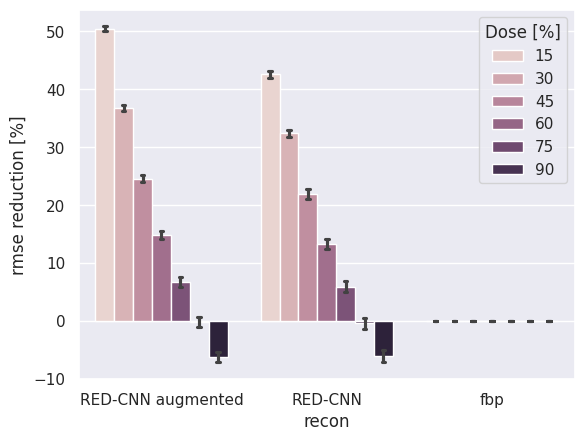

In [62]:
sns.barplot(data=results[(results['effective diameter [cm]']!=20)], x='recon', y='rmse reduction [%]', hue='Dose [%]', capsize=0.15)

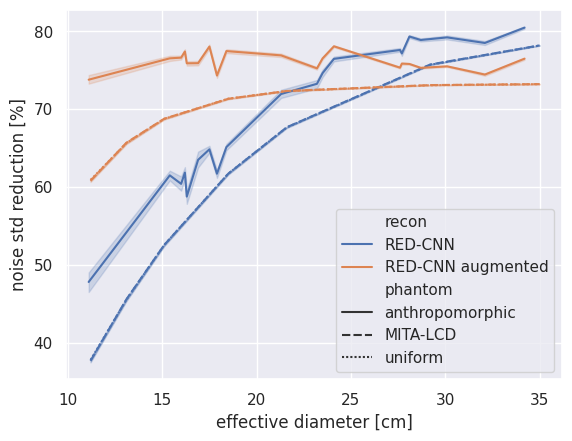

In [63]:
sns.lineplot(data=results[(results['Dose [%]']==25) & (results['effective diameter [cm]'] != 20)], x='effective diameter [cm]', y='noise std reduction [%]', style='phantom', hue='recon', hue_order=recons[1:]) 
plt.savefig('std_reduction.png', dpi=600)

Text(0, 0.5, 'mean effective waist diameter [mm]')

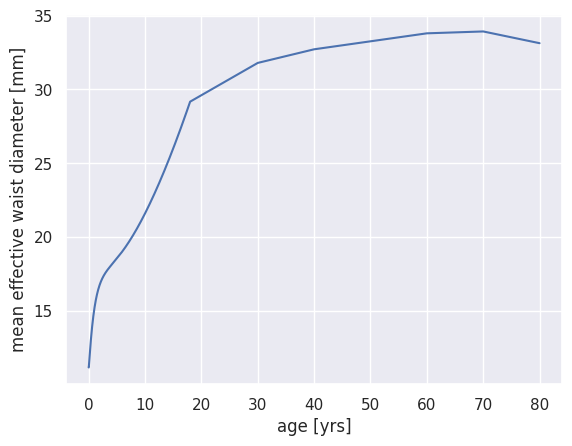

In [64]:
def age_to_eff_diameter(age):
    # https://www.aapm.org/pubs/reports/rpt_204.pdf
    x = age
    a = 18.788598
    b = 0.19486455
    c = -1.060056
    d = -7.6244784
    y = a + b*x**1.5 + c *x**0.5 + d*np.exp(-x)
    eff_diam = y
    return eff_diam

adult_waist_circumferences_cm = {
    # 20: 90.7,
    30: 99.9,
    40: 102.8,
    # 50: 103.3,
    60: 106.2,
    70: 106.6,
    80: 104.1
}

adult_waist_diam_mm = {a: c/np.pi for a,c in adult_waist_circumferences_cm.items()}
adult_waist_diam_mm

ages = np.linspace(0, 18,1000)
eff_diameters = np.array(list(map(age_to_eff_diameter, ages)))

ages = np.append(ages, list(adult_waist_diam_mm.keys()))
eff_diameters = np.append(eff_diameters, list(adult_waist_diam_mm.values()))

plt.plot(ages, eff_diameters)
plt.xlabel('age [yrs]')
plt.ylabel('mean effective waist diameter [mm]')

In [65]:
def diameter_range_from_subgroup(subgroup):
    if subgroup == 'newborn': return (0, age_to_eff_diameter(1/12))
    elif subgroup == 'infant': return (age_to_eff_diameter(1/12), age_to_eff_diameter(2))
    elif subgroup == 'child': return (age_to_eff_diameter(2), age_to_eff_diameter(12))
    elif subgroup == 'adolescent': return (age_to_eff_diameter(12), age_to_eff_diameter(22))
    else: return (age_to_eff_diameter(22), 100)

In [66]:
d = {group: diameter_range_from_subgroup(group) for group in results['pediatric subgroup'].unique()}
pd.DataFrame({'subgroup':d.keys(), 'age bin start':[0, 1/12, 2, 12, 22], 'effective diameter bin start [cm]': [o[0] for o in d.values()]})

,subgroup,age bin start,effective diameter bin start [cm]
0,newborn,0.000000,0.000000
1,infant,0.083333,11.472415
2,child,2.000000,16.808752
3,adolescent,12.000000,23.216777
4,adult,22.000000,33.924401


In [67]:
def pediatric_subgroup(diameter):
    if diameter < age_to_eff_diameter(1):
        return 'newborn'
    elif (diameter >= age_to_eff_diameter(1)) & (diameter < age_to_eff_diameter(5)):
        return 'infant'
    elif (diameter >= age_to_eff_diameter(5)) & (diameter < age_to_eff_diameter(12)):
        return 'child'
    elif (diameter >= age_to_eff_diameter(12)) & (diameter < age_to_eff_diameter(22)):
        return 'adolescent'
    else:
        return 'adult'

In [68]:
results['pediatric subgroup'] = results['effective diameter [cm]'].apply(pediatric_subgroup)
results

,experiment,Code #,Name,age [year],gender,weight [kg],height [cm],BMI,weight percentile,ethnicity,...,noise std [HU],rmse reduction [%],noise std reduction [%],observer,contrast [HU],snr,auc,delta auc,pediatric subgroup,is adult
0,noise reduction,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,...,27.290950,36.982130,65.015401,NaN,NaN,NaN,NaN,NaN,newborn,False
1,noise reduction,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,...,27.919199,36.775716,64.210042,NaN,NaN,NaN,NaN,NaN,newborn,False
2,noise reduction,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,...,24.748623,36.943534,68.274442,NaN,NaN,NaN,NaN,NaN,newborn,False
3,noise reduction,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,...,27.282190,37.185656,65.026631,NaN,NaN,NaN,NaN,NaN,newborn,False
4,noise reduction,Reference newborn,male infant,0.166,M,3.8,52.0,14.1,36.0,NaN,...,25.111681,37.686467,67.809033,NaN,NaN,NaN,NaN,NaN,newborn,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129075,task performance,NaN,35.0 cm MITA-LCD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NPW 2D,3.0,1.455877,0.8480,0.0234,adult,False
129076,task performance,NaN,35.0 cm MITA-LCD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NPW 2D,3.0,1.252556,0.8214,-0.0032,adult,False
129077,task performance,NaN,35.0 cm MITA-LCD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NPW 2D,3.0,1.214887,0.8060,-0.0186,adult,False
129078,task performance,NaN,35.0 cm MITA-LCD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NPW 2D,3.0,1.260605,0.8189,-0.0057,adult,False


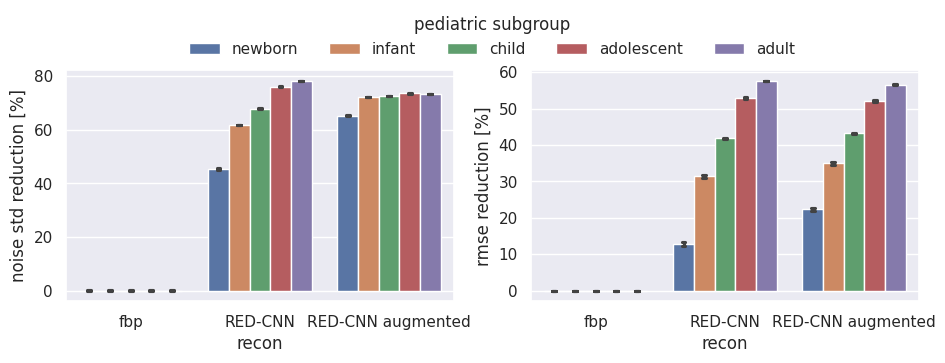

In [69]:
f, axs = plt.subplots(1,2, figsize=(11,3))
for idx, measure in enumerate(['noise std reduction [%]', 'rmse reduction [%]']):
    legend = True if idx < 1 else False 
    sns.barplot(ax=axs[idx], data=results[(results['effective diameter [cm]']!=20)  & (results['Dose [%]'] == 25)], x='recon', y=measure, order=recons, hue='pediatric subgroup', capsize=0.15, legend=legend)
sns.move_legend(
    axs[0], "lower center",
    bbox_to_anchor=(1.1, 1), ncol=5, frameon=False
)
plt.savefig('subgroup_denoising_comparison.png', dpi=600, bbox_inches='tight')

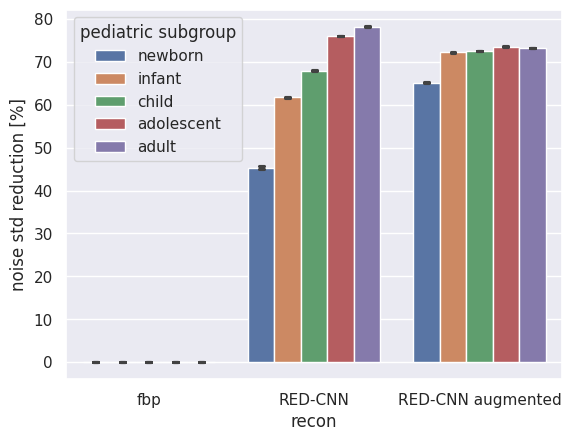

In [70]:
measure = 'noise std reduction [%]'
sns.barplot(data=results[(results['effective diameter [cm]']!=20)  & (results['Dose [%]'] == 25)], x='recon', y=measure, order=recons, hue='pediatric subgroup', capsize=0.15)
# sns.move_legend(
#     axs, "lower center",
#     bbox_to_anchor=(1.1, 1), ncol=5, frameon=False
# )
plt.savefig('subgroup_denoising_std_comparison.png', dpi=600, bbox_inches='tight')

In [71]:
means = results.groupby(['phantom', 'Dose [%]', 'pediatric subgroup','recon'])['noise std reduction [%]'].mean()
means['anthropomorphic'][25].astype(int)

pediatric subgroup  recon            
adolescent          RED-CNN              77
                    RED-CNN augmented    75
                    fbp                   0
adult               RED-CNN              80
                    RED-CNN augmented    76
                    fbp                   0
child               RED-CNN              72
                    RED-CNN augmented    76
                    fbp                   0
infant              RED-CNN              62
                    RED-CNN augmented    76
                    fbp                   0
newborn             RED-CNN              47
                    RED-CNN augmented    73
                    fbp                   0
Name: noise std reduction [%], dtype: int64

In [72]:
means = results.groupby(['phantom', 'Dose [%]', 'pediatric subgroup','recon'])['rmse reduction [%]'].mean()
means['anthropomorphic'][25].astype(int)

pediatric subgroup  recon            
adolescent          RED-CNN              46
                    RED-CNN augmented    46
                    fbp                   0
adult               RED-CNN              54
                    RED-CNN augmented    53
                    fbp                   0
child               RED-CNN              36
                    RED-CNN augmented    37
                    fbp                   0
infant              RED-CNN              19
                    RED-CNN augmented    22
                    fbp                   0
newborn             RED-CNN               8
                    RED-CNN augmented    17
                    fbp                   0
Name: rmse reduction [%], dtype: int64

It was aliasing! this shows tha the anthropomorphic does track with uniform and that augmentation does help the smallest patients in terms of RMSE reduction as well

experiment                                                   noise reduction
Code #                                                     Reference newborn
Name                                                             male infant
age [year]                                                             0.166
gender                                                                     M
weight [kg]                                                              3.8
height [cm]                                                             52.0
BMI                                                                     14.1
weight percentile                                                       36.0
ethnicity                                                                NaN
effective diameter [cm]                                                 11.1
Dose [%]                                                                 100
recon                                                                RED-CNN

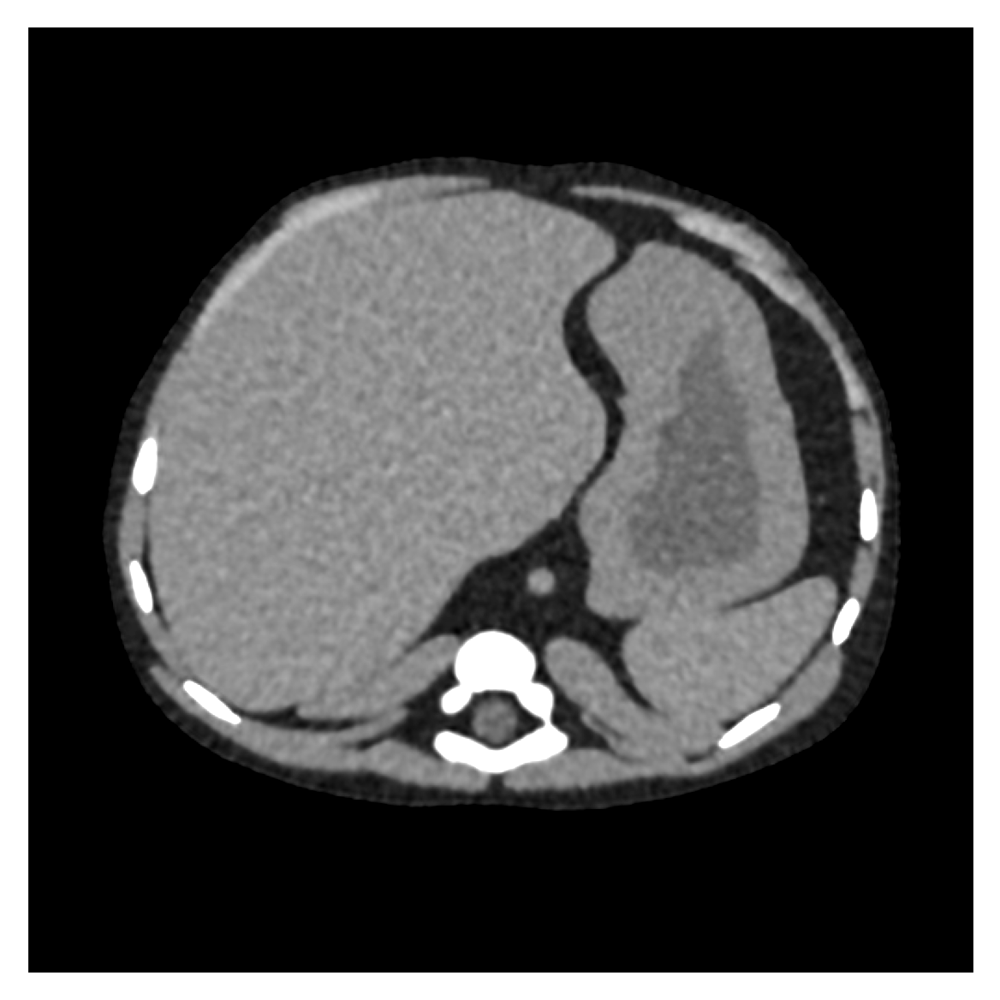

In [73]:
patient = results[(results.phantom == 'anthropomorphic') & (results.recon != 'fbp') ].sort_values(by='rmse reduction [%]').iloc[0]
print(patient)
plt.figure(dpi=300)
ctshow(load_mhd(anthro_dir / patient.file)[0])

experiment                                                   noise reduction
Code #                                                     Reference newborn
Name                                                             male infant
age [year]                                                             0.166
gender                                                                     M
weight [kg]                                                              3.8
height [cm]                                                             52.0
BMI                                                                     14.1
weight percentile                                                       36.0
ethnicity                                                                NaN
effective diameter [cm]                                                 11.1
Dose [%]                                                                  25
recon                                                                RED-CNN

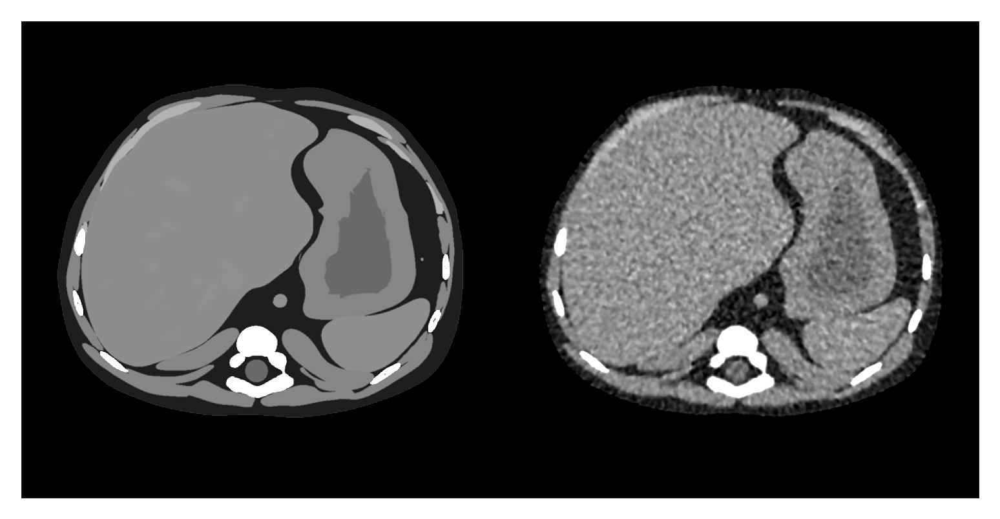

In [74]:
patient = results[(results.phantom == 'anthropomorphic') & (results.recon != 'fbp') & (results['Dose [%]'] == 25)].sort_values(by='rmse reduction [%]').iloc[0]
print(patient)
img = load_mhd(anthro_dir / patient.file)[0] 
gt = load_mhd(anthro_dir / get_ground_truth(patient.file)) - 1000
plt.figure(dpi=300)
ctshow(np.concatenate([gt, img], axis=1))

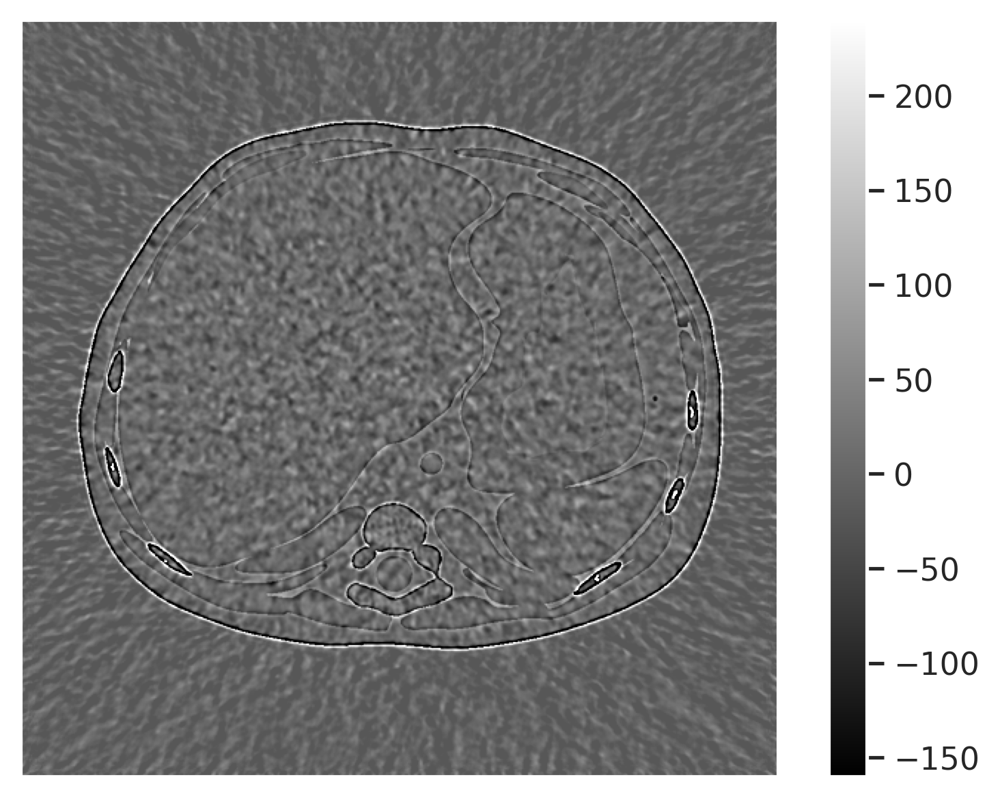

In [75]:
plt.figure(dpi=300)
ctshow(img-gt)
plt.colorbar()

experiment                                                   noise reduction
Code #                                                                   148
Name                                                              male pt148
age [year]                                                              52.0
gender                                                                     M
weight [kg]                                                            108.0
height [cm]                                                            183.2
BMI                                                                    32.18
weight percentile                                                       92.5
ethnicity                                                              white
effective diameter [cm]                                                 34.2
Dose [%]                                                                  25
recon                                                                RED-CNN

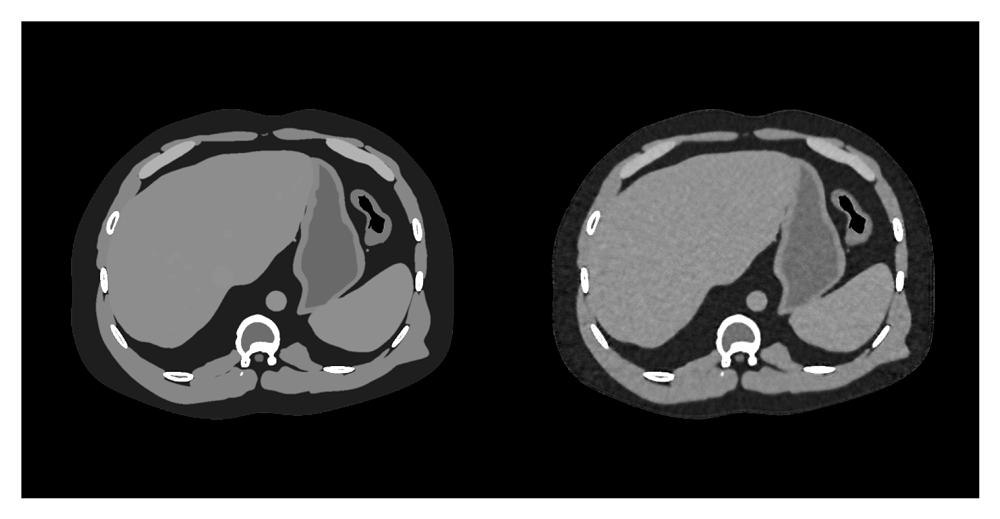

In [76]:
patient = results[(results.phantom == 'anthropomorphic') & (results.recon != 'fbp') & (results['Dose [%]'] == 25)].sort_values(by='rmse reduction [%]').iloc[-1]
print(patient)
img = load_mhd(anthro_dir / patient.file)[0] 
gt = load_mhd(anthro_dir / get_ground_truth(patient.file)) - 1000
plt.figure(dpi=300)
ctshow(np.concatenate([gt, img], axis=1))

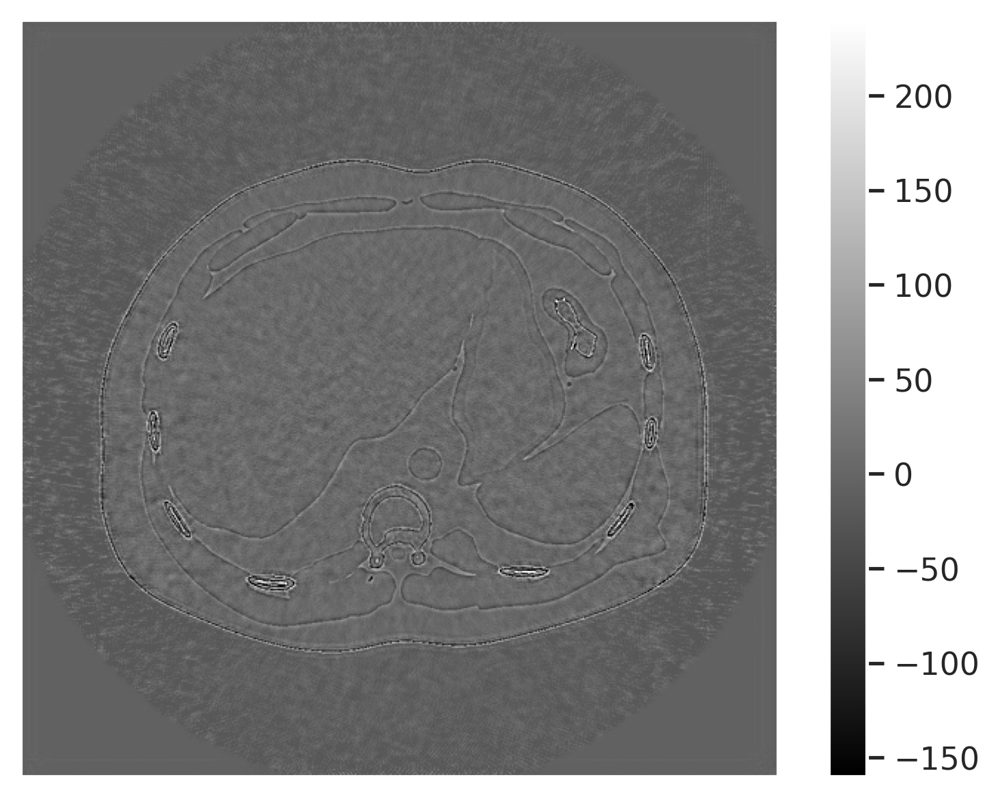

In [77]:
plt.figure(dpi=300)
ctshow(img-gt)
plt.colorbar()

**Why is it that infants have greater RMSE reduction than adults? This is contrary to the previous paper...**

ALIASING?? Could that be it, but im using the same phantoms (in the previous paper I used the *true* phantom - free of aliasing as the truth, not the noiseless one), trying using true.mhd rather than noise free 

Yes it was aliasing, the one mystery remaining is why anthro slightly overperformed in the paper and now slightly under performs, this could be a noise thing or a definition thing but its not as big of a deal

In [78]:
plt.figure(dpi=300)
make_montage(anthro_meta, diameters = [11.1, 34.2], phantom = 'anthropomorphic', roi_center=(220, 170), roi_diameter=0.2, wwwl=(200, 100))

KeyError: 'effective diameter [cm]'

<Figure size 1920x1440 with 0 Axes>

In [ ]:
sns.lineplot(data=results[(results['Dose [%]']==25) &
                          (results['effective diameter [cm]'] != 20) &
                          (results['recon'] != 'fbp')], x='effective diameter [cm]', y='rmse reduction [%]', style='phantom', hue='recon', hue_order=recons[1:]) 

This basically replicates Fig 7 from Nelson 2023, but now with the augmentation in place. Can also show in terms of noise reduction which might be more compelling too

In [ ]:
import sys
import os
import torch
sys.path.append('../../denoising')
from networks import RED_CNN

In [ ]:
def load_model(save_path, iter_=13000, multi_gpu=False):
    REDCNN = RED_CNN()
    f = os.path.join(save_path, 'REDCNN_{}iter.ckpt'.format(iter_))
    if multi_gpu:
        state_d = OrderedDict()
        for k, v in torch.load(f):
            n = k[7:]
            state_d[n] = v
        REDCNN.load_state_dict(state_d)
        return REDCNN
    else:
        REDCNN.load_state_dict(torch.load(f))
        return REDCNN

cnn_denoiser = load_model('../../denoising/models/redcnn')
cnn_denoiser_augmented = load_model('../../denoising/models/redcnn_augmented')

## Bonus: Noise Reduction in Adult Patient Images
From Held out low dose grand challenge dataset. Same clinical site and scanner as training set but different patients.

In [ ]:
from collections import OrderedDict


def load_model(save_path, iter_=13000, multi_gpu=False):
    REDCNN = RED_CNN()
    f = os.path.join(save_path, 'REDCNN_{}iter.ckpt'.format(iter_))
    if multi_gpu:
        state_d = OrderedDict()
        for k, v in torch.load(f):
            n = k[7:]
            state_d[n] = v
        REDCNN.load_state_dict(state_d)
        return REDCNN
    else:
        REDCNN.load_state_dict(torch.load(f))
        return REDCNN

base_denoising_model  = load_model('../../denoising/models/redcnn')
aug_denoising_model = load_model('../../denoising/models/redcnn_augmented')

In [ ]:
test_input = np.load('../../data/Denoising_Data/test_input.npy').squeeze()
test_target = np.load('../../data/Denoising_Data/test_target.npy').squeeze()

nexample = 2
base_CNNout = base_denoising_model.predict(test_input[:, None, ...], batch_size=1).squeeze()
aug_CNNout = aug_denoising_model.predict(test_input[:, None, ...], batch_size=1).squeeze()

In [ ]:
plt.figure(figsize=(16, 8), tight_layout=True)

plt.subplot(2, 2, 1)
plt.title('Low Dose Input', fontsize=16)
ctshow(test_input[3, 110:-110, 50:-50])

plt.subplot(2, 2, 2)
plt.title('Hi Dose Input', fontsize=16)
ctshow(test_target[3, 110:-110, 50:-50])

plt.subplot(2, 2, 3)
plt.title('Base Denoiser', fontsize=16)
ctshow(base_CNNout[3, 110:-110, 50:-50])

plt.subplot(2, 2, 4)
plt.title('Denoiser with Augmentation', fontsize=16)
ctshow(aug_CNNout[3, 110:-110, 50:-50])
plt.savefig(f'test_patient.png', dpi=600, bbox_inches='tight')

In [ ]:
import pydicom

ld_dir = Path('/gpfs_projects/brandon.nelson/Mayo_LDGC/images/L506/quarter_3mm/')
fd_dir = Path('/gpfs_projects/brandon.nelson/Mayo_LDGC/images/L506/full_3mm/')
adult_ld_dcm_files = sorted(list(ld_dir.glob('*.IMA')))
adult_fd_dcm_files = sorted(list(fd_dir.glob('*.IMA')))

In [ ]:
adult_ld_dcm_files[:5], adult_fd_dcm_files[:5]

In [ ]:
import SimpleITK as sitk
def load_dcm_img(dcm_file):
    if isinstance(dcm_file, sitk.Image): return sitk.GetArrayFromImage(dcm_file)
    dcm = pydicom.read_file(dcm_file)
    return dcm.pixel_array + float(dcm.RescaleIntercept)

In [ ]:
idx = 30
ld = load_dcm_img(adult_ld_dcm_files[idx])
rd = load_dcm_img(adult_fd_dcm_files[idx])
ctshow(ld)

In [ ]:
denoised = cnn_denoiser.predict(ld).squeeze()

In [ ]:
ctshow(denoised)

In [ ]:
augmented = cnn_denoiser_augmented.predict(ld).squeeze()

In [ ]:
ctshow(augmented)

In [ ]:
plt.figure(dpi=300)
ctshow(np.concatenate([np.concatenate([ld, rd], axis=1),
                      np.concatenate([denoised, augmented], axis=1)], axis=0))

In [ ]:
plt.figure(dpi=300)
ctshow(np.concatenate([ld-rd, ld-denoised, ld-augmented],axis=1), (200, 0))

In [ ]:
ctshow(np.concatenate([rd - ld, rd-denoised, rd-augmented],axis=1), (200, 0))

In [ ]:
rmses = {v: rmse(k, rd) for (k, v) in zip([ld, denoised, augmented], ['low dose', 'redcnn', 'redcnn-aug'])}
rmses

In [ ]:
adult_fd_images = np.array([load_dcm_img(o) for o in sorted(adult_fd_dcm_files)])
adult_ld_images = np.array([load_dcm_img(o) for o in sorted(adult_ld_dcm_files)])
adult_fd_images.shape, adult_ld_images.shape

In [ ]:
cnn_denoiser.to('cuda')
cnn_denoiser.predict(adult_ld_images[:,None,:,:], device='cuda', batch_size=32);

In [ ]:
rmse(adult_fd_images, adult_ld_images)

In [ ]:
batch_size=32
device = 'cuda'

series_rmse = ['low dose', 'redcnn', 'redcnn-aug']
res = np.zeros((len(series_rmse), len(adult_ld_dcm_files)))
adult_fd_images = np.array([load_dcm_img(o) for o in sorted(adult_fd_dcm_files)])
adult_ld_images = np.array([load_dcm_img(o) for o in sorted(adult_ld_dcm_files)])

for d_idx, (denoiser, name) in enumerate(zip([None, cnn_denoiser, cnn_denoiser_augmented], series_rmse)):
    if denoiser is None:
       res[0, :] = list(map(lambda x, y: rmse(x, y), adult_ld_images, adult_fd_images))
    else:
        denoiser.to(device)
        denoised = denoiser.predict(adult_ld_images[:, None,:,:], device=device, batch_size=batch_size).squeeze()
        res[d_idx, :] = list(map(lambda x, y: rmse(x, y), denoised, adult_fd_images))

In [ ]:
rmse_df = pd.DataFrame(data=res.T, columns = series_rmse)
rmse_df['full dose file'] = str(adult_fd_dcm_files)
rmse_df['quarter dose file'] = str(adult_ld_dcm_files)
rmse_df

In [ ]:
sns.violinplot(data=rmse_df)
plt.ylabel('RMSE')
plt.title('Adult Real Patient Test Data from Mayo')

In [ ]:
sns.scatterplot(data=rmse_df,x='low dose', y='redcnn', label='redcnn')
sns.scatterplot(data=rmse_df,x='low dose', y='redcnn-aug', label='redcnn aug')
plt.ylabel('RMSE')
plt.legend()

The fact that the augmented model underperforms the original model when tested on *adult* data is unsurprising, our hypothesis is that it would act as a regularizer and yield more consistent performance in *smaller* patients, need to explore this next

### [Mayo Clinic Low-dose CT image and projection dataset](https://onlinelibrary.wiley.com/doi/abs/10.1002/mp.14594)

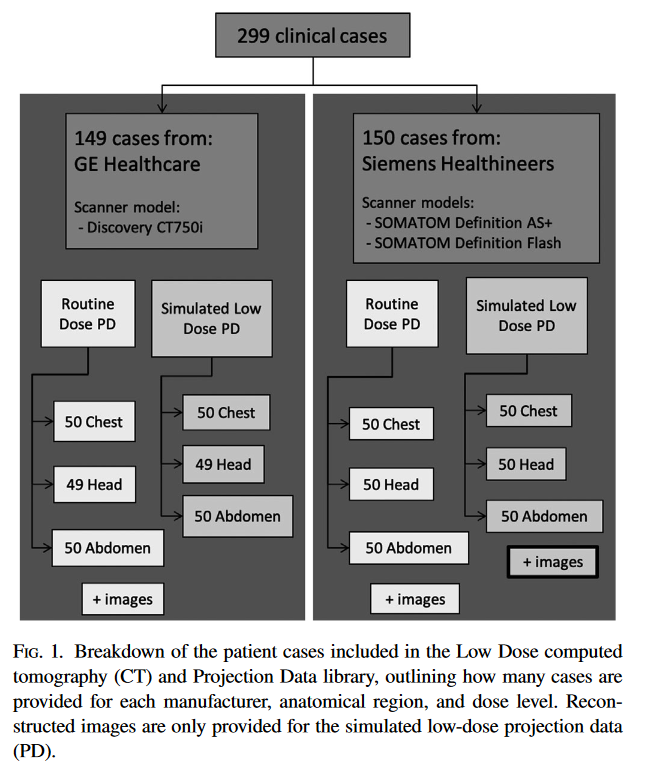

In [ ]:
ldct_dir = Path('/gpfs_projects/common_data/DLIR/TCIA/manifest-1643214718297')
meta = pd.read_csv(ldct_dir/'metadata.csv', index_col=0)
meta.head()

In [ ]:
patients = meta['Subject ID'].unique()
len(patients)

In [ ]:
subject_id = patients[0]
dose = 'Full' # 'Full' or 'Low'
assert(dose in ['Full', 'Low'])
n_images = meta[(meta['Subject ID']==subject_id) & (meta['Series Description']==f'{dose} Dose Images')]['Number of Images'].item()
image_dcms = sorted(list(Path(ldct_dir / meta[(meta['Subject ID']==subject_id) & (meta['Series Description']==f'{dose} Dose Images')]['File Location'].item().strip('./')).glob('*')))
assert(len(image_dcms) == n_images)

In [ ]:
ctshow(load_dcm_img(image_dcms[2]))

**Need to think about what this notebook adds and if its different from `patient images.ipynb`, the main message is denoising efficiency and thus belongs in that notebook**

## Conclusions

This can have the merged uniform and anthro rmse reduction plot like in Nelson et al 2023